# Garch Volatility Calculation and Weight Allocation

In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
from arch import arch_model
from datetime import date
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import ankitfinance as af
import tearsheet as ts

In [2]:
data=yf.download(tickers='CHAMBLFERT.NS',start='2015-01-01',end=date.today(),interval='1d')[['Adj Close']]

[*********************100%***********************]  1 of 1 completed


In [3]:
data_returns=data.pct_change().dropna()

In [4]:
model = arch_model(data_returns,p=1,q=1)


In [5]:
model_fit = model.fit()
vol=pd.DataFrame({"vol":np.sqrt(model_fit.conditional_volatility)})

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4978753.918653337
Iteration:      2,   Func. Count:     17,   Neg. LLF: -3846.08396297454
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3846.083963320598
            Iterations: 6
            Function evaluations: 17
            Gradient evaluations: 2


In [6]:
vol.index=pd.to_datetime(vol.index)

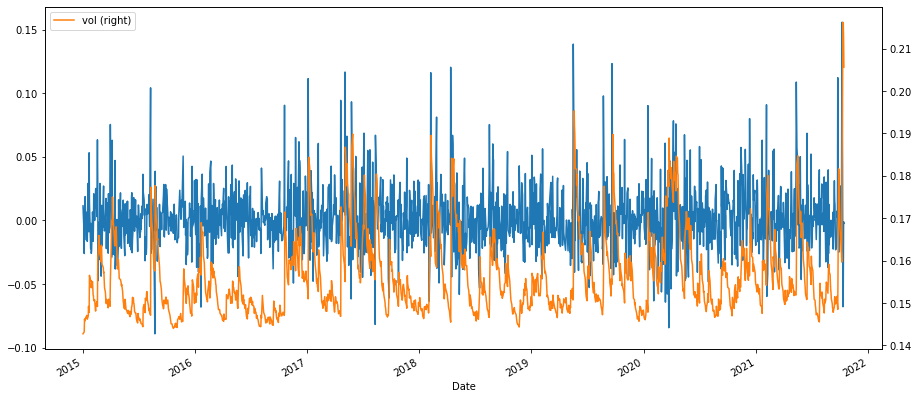

In [7]:
data_returns['Adj Close'].plot(figsize=(15,7))
vol['vol'].plot(secondary_y=True,legend=True,sharex=True)

In [8]:
model_fit.arch_lm_test

<bound method ARCHModelFixedResult.arch_lm_test of                      Constant Mean - GARCH Model Results                      
Dep. Variable:              Adj Close   R-squared:                      -0.000
Mean Model:             Constant Mean   Adj. R-squared:                 -0.000
Vol Model:                      GARCH   Log-Likelihood:                3846.08
Distribution:                  Normal   AIC:                          -7684.17
Method:            Maximum Likelihood   BIC:                          -7662.48
                                        No. Observations:                 1672
Date:                Sun, Oct 17 2021   Df Residuals:                     1668
Time:                        13:06:33   Df Model:                            4
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu     

In [9]:
f=pd.concat([vol,data_returns],axis=1)

In [10]:
f.corr()

,vol,Adj Close
vol,1.000000,-0.012807
Adj Close,-0.012807,1.000000


# Weight Allocation

In [11]:
stock_1=yf.download(tickers='CHAMBLFERT.NS',start='2015-01-01',end=date.today(),interval='1d')[['Adj Close']]
stock_2=yf.download(tickers='ASIANPAINT.NS',start='2015-01-01',end=date.today(),interval='1d')[['Adj Close']]


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [12]:
stock_1_ret=stock_1.pct_change().dropna()
stock_2_ret=stock_2.pct_change().dropna()

In [13]:
model1=arch_model(stock_1_ret,p=3,q=3)
model2=arch_model(stock_2_ret,p=3,q=3)
fit1=model1.fit()
fit2=model2.fit()

Iteration:      1,   Func. Count:     10,   Neg. LLF: 177500961.86291197
Iteration:      2,   Func. Count:     26,   Neg. LLF: 109423.72108961645
Iteration:      3,   Func. Count:     42,   Neg. LLF: 19961.48327765364
Iteration:      4,   Func. Count:     57,   Neg. LLF: 29280748.93560338
Iteration:      5,   Func. Count:     73,   Neg. LLF: 56358.87283859094
Iteration:      6,   Func. Count:     88,   Neg. LLF: 484584.12094423553
Iteration:      7,   Func. Count:    104,   Neg. LLF: 835353.6871289519
Iteration:      8,   Func. Count:    120,   Neg. LLF: 2053523.1474202513
Iteration:      9,   Func. Count:    137,   Neg. LLF: 10010.18655555988
Iteration:     10,   Func. Count:    150,   Neg. LLF: -3841.201992562109
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3841.2019906894493
            Iterations: 14
            Function evaluations: 150
            Gradient evaluations: 10
Iteration:      1,   Func. Count:     10,   Neg. LLF: 191096841

In [14]:
vol1=pd.DataFrame({"vol":np.sqrt(fit1.conditional_volatility)})
vol2=pd.DataFrame({"vol":np.sqrt(fit2.conditional_volatility)})

In [16]:
concated=pd.concat([vol1,vol2],axis=1)

In [17]:
concated.columns=['Ch','As']

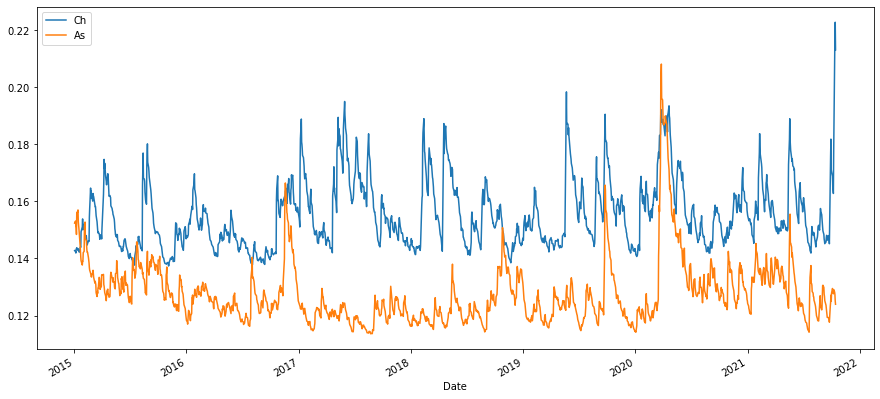

In [37]:
concated.plot(figsize=(15,7))

In [18]:
def ratio(cv_frame):
    cov=cv_frame.cov().iloc[1,0]
    var_max=cv_frame.var().max()
    var_min=cv_frame.var().min()
    w=(var_min-cov)/(var_min-(2*cov)+var_max)
    return w

In [19]:
def weights(w):
    if w <0:
        weight_s=0
        weight_f=1-weight_s
    if 0<=w<=1:
        weight_s=w
        weight_f=1-weight_s
    if w>1:
        weight_s=1
        weight_f=1-weight_s
    
    weight=pd.DataFrame([weight_f,weight_s]).T
    weight.columns=['Less-Vol','More-Vol']
    return weight

In [20]:
df=pd.DataFrame()

In [21]:
for index in range(len(concated)-15):
    sample=concated.iloc[index:index+15]
    w=ratio(sample)
    w_=weights(w)
    df=df.append(pd.DataFrame(w_),ignore_index=True)

In [22]:
df.index=concated.iloc[15:].index

In [23]:
returns_table=pd.concat([stock_1_ret,stock_2_ret],axis=1)

In [24]:
returns_table.columns=['Ch','As']

In [25]:
port= df * returns_table.iloc[15:].values

In [26]:
port=pd.DataFrame({"Return":port.sum(axis=1)})

In [27]:
port.index=pd.to_datetime(port.index)

In [28]:
port_monthly=port.resample(rule='M').apply(af.compound)

In [29]:
af.annualdata(port_monthly)

,Monthly Returns,Annual Returns,Annual Volatility,Monthly Volatility,Sharpe Ratio,Sortino Ratio,Doubling Index
Return,2.943652,41.642914,0.324438,0.093657,1.129428,2.276363,1.728986


## Rolling Model and calculation

In [56]:
df_=pd.DataFrame()

In [63]:
for steps in range(len(stock_1_ret)-15):
    sample_1=stock_1_ret.iloc[steps:steps+15]
    sample_2=stock_2_ret.iloc[steps:steps+15]
    Model1=arch_model(sample_1,p=2,q=2)
    Model2=arch_model(sample_2,p=2,q=2)
    fit_1=Model1.fit()
    fit_2=Model2.fit()
    Vol1=pd.DataFrame({"vol":np.sqrt(fit_1.conditional_volatility)})
    Vol2=pd.DataFrame({"vol":np.sqrt(fit_2.conditional_volatility)})
    concat=pd.concat([Vol1,Vol2],axis=1)
    concat.columns=['Ch','As']
    concat_mean=pd.DataFrame(concat.mean())
    #append=pd.DataFrame(concat.iloc[-1]).T
    w_c=ratio(concat)
    w_1=weights(w_c)
    df_=df_.append(w_1)
    

Iteration:      1,   Func. Count:      8,   Neg. LLF: 9107.686567865501
Iteration:      2,   Func. Count:     19,   Neg. LLF: -15.91049891605933
Iteration:      3,   Func. Count:     30,   Neg. LLF: -37.89876409255793
Iteration:      4,   Func. Count:     37,   Neg. LLF: -37.81896395714231
Iteration:      5,   Func. Count:     45,   Neg. LLF: -37.94397338490465
Iteration:      6,   Func. Count:     52,   Neg. LLF: -37.9866894049722
Iteration:      7,   Func. Count:     59,   Neg. LLF: -37.99696685497297
Iteration:      8,   Func. Count:     66,   Neg. LLF: -37.99741000784857
Iteration:      9,   Func. Count:     73,   Neg. LLF: -37.99814136298978
Iteration:     10,   Func. Count:     80,   Neg. LLF: -37.99816653003422
Iteration:     11,   Func. Count:     87,   Neg. LLF: -37.9981712021513
Iteration:     12,   Func. Count:     93,   Neg. LLF: -37.998171216925144
Optimization terminated successfully    (Exit mode 0)
            Current function value: -37.9981712021513
            Iterat

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     35,   Neg. LLF: -37.36470139279825
Iteration:      5,   Func. Count:     44,   Neg. LLF: -42.0166557336285
Iteration:      6,   Func. Count:     51,   Neg. LLF: -22.260118204591098
Iteration:      7,   Func. Count:     60,   Neg. LLF: 4479739.503727123
Iteration:      8,   Func. Count:     72,   Neg. LLF: 720572.7737689567
Iteration:      9,   Func. Count:     84,   Neg. LLF: -3.414306017014855
Iteration:     10,   Func. Count:     94,   Neg. LLF: -32.797783178507885
Iteration:     11,   Func. Count:    103,   Neg. LLF: 766863.9759786678
Iteration:     12,   Func. Count:    115,   Neg. LLF: 311254.00523925736
Iteration:     13,   Func. Count:    126,   Neg. LLF: -42.0864362866685
Optimization terminated successfully    (Exit mode 0)
            Current function value: -42.08643623355988
            Iterations: 17
            Function evaluations: 126
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      8,   Neg. LLF: 9536.623

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:     97,   Neg. LLF: -43.84635556822828
Iteration:     13,   Func. Count:    104,   Neg. LLF: -43.84794467345894
Iteration:     14,   Func. Count:    111,   Neg. LLF: -43.848364897775426
Iteration:     15,   Func. Count:    118,   Neg. LLF: -43.84866721658803
Iteration:     16,   Func. Count:    125,   Neg. LLF: -43.84866980748182
Iteration:     17,   Func. Count:    131,   Neg. LLF: -43.84866980029683
Optimization terminated successfully    (Exit mode 0)
            Current function value: -43.84866980748182
            Iterations: 17
            Function evaluations: 131
            Gradient evaluations: 17
Iteration:      1,   Func. Count:      8,   Neg. LLF: 532.8267052973721
Iteration:      2,   Func. Count:     19,   Neg. LLF: -18.555231715494813
Iteration:      3,   Func. Count:     30,   Neg. LLF: 976.8729337958501
Iteration:      4,   Func. Count:     38,   Neg. LLF: -22.76277226060593
Iteration:      5,   Func. Count:     46,   Neg. LLF: -43.3

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      6,   Func. Count:     53,   Neg. LLF: -41.41013833796627
Iteration:      7,   Func. Count:     60,   Neg. LLF: -41.410179719852465
Iteration:      8,   Func. Count:     67,   Neg. LLF: -41.410185132233
Iteration:      9,   Func. Count:     74,   Neg. LLF: -41.41018571247124
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.41018571247124
            Iterations: 9
            Function evaluations: 74
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      8,   Neg. LLF: 150000332434.19028
Iteration:      2,   Func. Count:     20,   Neg. LLF: 2857.703009216983
Iteration:      3,   Func. Count:     29,   Neg. LLF: -38.99521064543205
Iteration:      4,   Func. Count:     36,   Neg. LLF: -38.89658109890241
Iteration:      5,   Func. Count:     44,   Neg. LLF: -35.0997271960162
Iteration:      6,   Func. Count:     52,   Neg. LLF: -35.07839862824591
Iteration:      7,   Func. Count:     60,   Neg. LLF: -35.3081024

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     47,   Neg. LLF: -40.90916423742565
Iteration:      6,   Func. Count:     54,   Neg. LLF: -41.086323306636714
Iteration:      7,   Func. Count:     61,   Neg. LLF: -41.11575432353588
Iteration:      8,   Func. Count:     68,   Neg. LLF: -41.122885326171286
Iteration:      9,   Func. Count:     75,   Neg. LLF: -41.133170810891414
Iteration:     10,   Func. Count:     82,   Neg. LLF: -41.13359892347905
Iteration:     11,   Func. Count:     89,   Neg. LLF: -41.13364390765884
Iteration:     12,   Func. Count:     96,   Neg. LLF: -41.13364907236836
Iteration:     13,   Func. Count:    103,   Neg. LLF: -41.133651403298586
Iteration:     14,   Func. Count:    109,   Neg. LLF: -41.13365138981033
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.133651403298586
            Iterations: 14
            Function evaluations: 109
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      8,   Neg. LLF: 

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 652076.0918268029
Iteration:      2,   Func. Count:     19,   Neg. LLF: 1539.7099832003698
Iteration:      3,   Func. Count:     28,   Neg. LLF: -36.77616903815825
Iteration:      4,   Func. Count:     35,   Neg. LLF: -37.12495000167908
Iteration:      5,   Func. Count:     42,   Neg. LLF: -37.120284807979495
Iteration:      6,   Func. Count:     50,   Neg. LLF: -37.16927061156846
Iteration:      7,   Func. Count:     57,   Neg. LLF: -37.17305869665616
Iteration:      8,   Func. Count:     64,   Neg. LLF: -37.17402915725239
Iteration:      9,   Func. Count:     71,   Neg. LLF: -37.17455561138379
Iteration:     10,   Func. Count:     78,   Neg. LLF: -6.305370929063502
Optimization terminated successfully    (Exit mode 0)
            Current function value: -37.17455564778772
            Iterations: 11
            Function evaluations: 83
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      8,   Neg. LLF: 14819.

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 1129956285.3519635
Iteration:      2,   Func. Count:     20,   Neg. LLF: 64959.169548976686
Iteration:      3,   Func. Count:     29,   Neg. LLF: -41.58439124695216
Iteration:      4,   Func. Count:     36,   Neg. LLF: -41.5858718176706
Iteration:      5,   Func. Count:     43,   Neg. LLF: -41.58619246397314
Iteration:      6,   Func. Count:     50,   Neg. LLF: -41.586193981375075
Iteration:      7,   Func. Count:     56,   Neg. LLF: -41.58619398124152
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.586193981375075
            Iterations: 7
            Function evaluations: 56
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      8,   Neg. LLF: 27669.424278647064
Iteration:      2,   Func. Count:     19,   Neg. LLF: 5975401.998346567
Iteration:      3,   Func. Count:     28,   Neg. LLF: -37.47193554126647
Iteration:      4,   Func. Count:     35,   Neg. LLF: -37.7933

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 1568882.3920394059
Iteration:      2,   Func. Count:     20,   Neg. LLF: 290773.8282434315
Iteration:      3,   Func. Count:     28,   Neg. LLF: -42.66184269087217
Iteration:      4,   Func. Count:     35,   Neg. LLF: -38.58930385561537
Iteration:      5,   Func. Count:     44,   Neg. LLF: -42.04543484542903
Iteration:      6,   Func. Count:     53,   Neg. LLF: -43.89585356051106
Iteration:      7,   Func. Count:     60,   Neg. LLF: -43.99919029024429
Iteration:      8,   Func. Count:     67,   Neg. LLF: -44.031444713390464
Iteration:      9,   Func. Count:     74,   Neg. LLF: -44.05420161719445
Iteration:     10,   Func. Count:     81,   Neg. LLF: -44.063633849434936
Iteration:     11,   Func. Count:     88,   Neg. LLF: -44.065699175347184
Iteration:     12,   Func. Count:     95,   Neg. LLF: 15114.001303497827
Iteration:     13,   Func. Count:    108,   Neg. LLF: -44.03661271949639
Iteration:     14,   Func. Count:    117,   Neg. 

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     10,   Func. Count:     79,   Neg. LLF: -39.56237628031278
Optimization terminated successfully    (Exit mode 0)
            Current function value: -39.56237628752806
            Iterations: 10
            Function evaluations: 79
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      8,   Neg. LLF: 5209184.186563833
Iteration:      2,   Func. Count:     20,   Neg. LLF: 21985521187.06573
Iteration:      3,   Func. Count:     31,   Neg. LLF: 1034510563432.3198
Iteration:      4,   Func. Count:     42,   Neg. LLF: -41.980964130172254
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.98096423854722
            Iterations: 8
            Function evaluations: 42
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      8,   Neg. LLF: 882.8983401763699
Iteration:      2,   Func. Count:     19,   Neg. LLF: 646.3896543280638
Iteration:      3,   Func. Count:     27,   Neg. LLF: 91.42469268856597
I

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:     82,   Neg. LLF: -51.149164491037396
Iteration:      9,   Func. Count:     89,   Neg. LLF: -51.16122876868922
Iteration:     10,   Func. Count:     96,   Neg. LLF: -51.161767789696576
Iteration:     11,   Func. Count:    103,   Neg. LLF: -51.16243113143426
Iteration:     12,   Func. Count:    110,   Neg. LLF: -51.16334794638273
Iteration:     13,   Func. Count:    117,   Neg. LLF: -51.16565565770709
Iteration:     14,   Func. Count:    124,   Neg. LLF: -51.17523486288809
Iteration:     15,   Func. Count:    131,   Neg. LLF: 1070.7047938475623
Iteration:     16,   Func. Count:    143,   Neg. LLF: 307.68133710179796
Iteration:     17,   Func. Count:    155,   Neg. LLF: -50.41344629358652
Optimization terminated successfully    (Exit mode 0)
            Current function value: -51.17532030022308
            Iterations: 19
            Function evaluations: 165
            Gradient evaluations: 17
Iteration:      1,   Func. Count:      8,   Neg. LLF: 232

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      9,   Func. Count:     77,   Neg. LLF: -31.634755754028134
Iteration:     10,   Func. Count:     85,   Neg. LLF: -31.695283589905404
Iteration:     11,   Func. Count:     92,   Neg. LLF: -31.69613328134535
Iteration:     12,   Func. Count:     99,   Neg. LLF: -31.696183380198615
Iteration:     13,   Func. Count:    106,   Neg. LLF: -31.69618445989976
Iteration:     14,   Func. Count:    112,   Neg. LLF: -31.69618445533126
Optimization terminated successfully    (Exit mode 0)
            Current function value: -31.69618445989976
            Iterations: 14
            Function evaluations: 112
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1279987.9601992574
Iteration:      2,   Func. Count:     20,   Neg. LLF: -37.41010712350307
Iteration:      3,   Func. Count:     30,   Neg. LLF: -44.29034882821413
Iteration:      4,   Func. Count:     38,   Neg. LLF: -48.09341482284913
Iteration:      5,   Func. Count:     46,   Neg. LLF: -3

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     20,   Neg. LLF: -19.532981112200723
Iteration:      3,   Func. Count:     30,   Neg. LLF: -39.02322274009206
Iteration:      4,   Func. Count:     37,   Neg. LLF: -39.023288221124155
Iteration:      5,   Func. Count:     44,   Neg. LLF: -39.02409147692323
Iteration:      6,   Func. Count:     51,   Neg. LLF: -38.93703211053716
Iteration:      7,   Func. Count:     59,   Neg. LLF: -39.02496221609946
Iteration:      8,   Func. Count:     66,   Neg. LLF: -39.02322197564996
Iteration:      9,   Func. Count:     74,   Neg. LLF: -39.025541230665645
Iteration:     10,   Func. Count:     81,   Neg. LLF: -39.02558647152951
Iteration:     11,   Func. Count:     88,   Neg. LLF: -39.02565617879706
Iteration:     12,   Func. Count:     95,   Neg. LLF: -39.02585131098826
Iteration:     13,   Func. Count:    102,   Neg. LLF: -39.026177063380224
Iteration:     14,   Func. Count:    109,   Neg. LLF: -39.02659554039928
Iteration:     15,   Func. Count:    116,   Neg

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      7,   Func. Count:     60,   Neg. LLF: -38.88576854940088
Iteration:      8,   Func. Count:     68,   Neg. LLF: -39.00971085670532
Iteration:      9,   Func. Count:     76,   Neg. LLF: -38.987208908324966
Iteration:     10,   Func. Count:     84,   Neg. LLF: -38.98499212417754
Iteration:     11,   Func. Count:     92,   Neg. LLF: -38.989307732097494
Iteration:     12,   Func. Count:    100,   Neg. LLF: 4454426.329854392
Iteration:     13,   Func. Count:    112,   Neg. LLF: 2908.281360072983
Iteration:     14,   Func. Count:    122,   Neg. LLF: -39.14316669154568
Iteration:     15,   Func. Count:    129,   Neg. LLF: 1241102.2239296872
Iteration:     16,   Func. Count:    141,   Neg. LLF: 53516989.09452155
Iteration:     17,   Func. Count:    150,   Neg. LLF: -37.360013513338835
Iteration:     18,   Func. Count:    159,   Neg. LLF: 212625.8020212126
Iteration:     19,   Func. Count:    171,   Neg. LLF: -39.00790413565048
Iteration:     20,   Func. Count:    179,   Neg. LL

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 216495.89115047053
Iteration:      2,   Func. Count:     20,   Neg. LLF: -24.609892828381305
Iteration:      3,   Func. Count:     28,   Neg. LLF: -35.41445099114798
Iteration:      4,   Func. Count:     36,   Neg. LLF: -36.71300183064436
Iteration:      5,   Func. Count:     44,   Neg. LLF: -36.81412009515033
Iteration:      6,   Func. Count:     51,   Neg. LLF: -36.81946611018065
Iteration:      7,   Func. Count:     58,   Neg. LLF: -36.81577153294781
Iteration:      8,   Func. Count:     66,   Neg. LLF: -36.82464930939156
Iteration:      9,   Func. Count:     73,   Neg. LLF: -36.85784524440346
Iteration:     10,   Func. Count:     80,   Neg. LLF: -36.85881915712437
Iteration:     11,   Func. Count:     88,   Neg. LLF: -36.86117867114715
Iteration:     12,   Func. Count:     96,   Neg. LLF: -36.86213683627962
Iteration:     13,   Func. Count:    102,   Neg. LLF: -36.86213683489269
Optimization terminated successfully    (Exit mode

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     10,   Func. Count:     80,   Neg. LLF: -27.718586148564732
Optimization terminated successfully    (Exit mode 0)
            Current function value: -27.718586148564732
            Iterations: 10
            Function evaluations: 80
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1271893787.7157054
Iteration:      2,   Func. Count:     21,   Neg. LLF: 2779.9096763786993
Iteration:      3,   Func. Count:     30,   Neg. LLF: -51.00695124950375
Iteration:      4,   Func. Count:     37,   Neg. LLF: -51.007820463158886
Iteration:      5,   Func. Count:     44,   Neg. LLF: -51.008112597673595
Iteration:      6,   Func. Count:     51,   Neg. LLF: -51.00824079968996
Iteration:      7,   Func. Count:     58,   Neg. LLF: -51.00844579033342
Iteration:      8,   Func. Count:     65,   Neg. LLF: -51.00848664160964
Iteration:      9,   Func. Count:     72,   Neg. LLF: -51.00848123814895
Optimization terminated successfully    (Exit mode 0)
  

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     67,   Neg. LLF: -15.765773309259618
Iteration:      8,   Func. Count:     78,   Neg. LLF: -41.4743410366431
Iteration:      9,   Func. Count:     85,   Neg. LLF: -41.474298026474486
Iteration:     10,   Func. Count:     93,   Neg. LLF: -41.474860393468134
Iteration:     11,   Func. Count:    100,   Neg. LLF: -41.47580796359667
Iteration:     12,   Func. Count:    107,   Neg. LLF: -41.52199587870149
Iteration:     13,   Func. Count:    114,   Neg. LLF: -41.52814995281344
Iteration:     14,   Func. Count:    121,   Neg. LLF: -41.53094420876744
Iteration:     15,   Func. Count:    128,   Neg. LLF: -41.530808892542765
Iteration:     16,   Func. Count:    136,   Neg. LLF: -41.530332768723746
Iteration:     17,   Func. Count:    144,   Neg. LLF: -41.53137512768446
Iteration:     18,   Func. Count:    151,   Neg. LLF: -41.53188082999099
Iteration:     19,   Func. Count:    158,   Neg. LLF: 117958.03882348994
Iteration:     20,   Func. Count:    169,   Neg

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: -23.080300252586735
Iteration:      2,   Func. Count:     18,   Neg. LLF: 3641.7863710122106
Iteration:      3,   Func. Count:     30,   Neg. LLF: -44.93184900795269
Iteration:      4,   Func. Count:     37,   Neg. LLF: -44.932358075695284
Iteration:      5,   Func. Count:     44,   Neg. LLF: -44.93244575454007
Iteration:      6,   Func. Count:     51,   Neg. LLF: -44.93248984551341
Iteration:      7,   Func. Count:     58,   Neg. LLF: -44.93250391379227
Optimization terminated successfully    (Exit mode 0)
            Current function value: -44.93250391379227
            Iterations: 7
            Function evaluations: 58
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1054250396041.6926
Iteration:      2,   Func. Count:     19,   Neg. LLF: -38.48009788624375
Optimization terminated successfully    (Exit mode 0)
            Current function value: -38.48009799078473
            Iterations: 

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 4769204.43839517
Iteration:      2,   Func. Count:     21,   Neg. LLF: -51.23202594103961
Iteration:      3,   Func. Count:     31,   Neg. LLF: -29.480395661084074
Iteration:      4,   Func. Count:     39,   Neg. LLF: -54.54222418420281
Iteration:      5,   Func. Count:     47,   Neg. LLF: -55.20212217727382
Iteration:      6,   Func. Count:     54,   Neg. LLF: -54.539780723407915
Iteration:      7,   Func. Count:     62,   Neg. LLF: 147140734.64089558
Iteration:      8,   Func. Count:     75,   Neg. LLF: 3933.390676990603
Iteration:      9,   Func. Count:     86,   Neg. LLF: 59081.18231098715
Iteration:     10,   Func. Count:     99,   Neg. LLF: -55.43374754184611
Optimization terminated successfully    (Exit mode 0)
            Current function value: -55.43374758154908
            Iterations: 14
            Function evaluations: 99
            Gradient evaluations: 10
Iteration:      1,   Func. Count:      8,   Neg. LLF: 81856.97

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      5,   Func. Count:     43,   Neg. LLF: -26.95033797383541
Iteration:      6,   Func. Count:     52,   Neg. LLF: -27.32589624354786
Iteration:      7,   Func. Count:     60,   Neg. LLF: -28.517900283217397
Iteration:      8,   Func. Count:     67,   Neg. LLF: -24.65575366366325
Iteration:      9,   Func. Count:     75,   Neg. LLF: -28.602109129253513
Iteration:     10,   Func. Count:     82,   Neg. LLF: -28.7246809056807
Iteration:     11,   Func. Count:     89,   Neg. LLF: -28.736426150541167
Iteration:     12,   Func. Count:     96,   Neg. LLF: -28.73666604236844
Iteration:     13,   Func. Count:    103,   Neg. LLF: -28.736688898551236
Iteration:     14,   Func. Count:    109,   Neg. LLF: -28.73668890106074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -28.736688898551236
            Iterations: 14
            Function evaluations: 109
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      4,   Func. Count:     36,   Neg. LLF: -35.072755169851476
Iteration:      5,   Func. Count:     43,   Neg. LLF: -35.07826340339474
Iteration:      6,   Func. Count:     50,   Neg. LLF: -35.082943955080346
Iteration:      7,   Func. Count:     57,   Neg. LLF: -35.16016466086697
Iteration:      8,   Func. Count:     64,   Neg. LLF: -34.8751259357373
Iteration:      9,   Func. Count:     72,   Neg. LLF: 23389023.99407984
Iteration:     10,   Func. Count:     84,   Neg. LLF: 8758608.967972143
Iteration:     11,   Func. Count:     93,   Neg. LLF: -35.22006439279745
Iteration:     12,   Func. Count:    100,   Neg. LLF: -33.85834019791711
Optimization terminated successfully    (Exit mode 0)
            Current function value: -35.22006446716968
            Iterations: 13
            Function evaluations: 104
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      8,   Neg. LLF: 72742.62272614347
Iteration:      2,   Func. Count:     20,   Neg. LLF: -34.00

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     28,   Neg. LLF: 264086.56739007775
Iteration:      4,   Func. Count:     40,   Neg. LLF: -37.505585395799635
Iteration:      5,   Func. Count:     48,   Neg. LLF: 18.092485274319884
Iteration:      6,   Func. Count:     56,   Neg. LLF: 30.48116708205363
Iteration:      7,   Func. Count:     64,   Neg. LLF: -39.69613908257351
Iteration:      8,   Func. Count:     71,   Neg. LLF: -40.94756176245209
Iteration:      9,   Func. Count:     78,   Neg. LLF: 151534.77946253962
Iteration:     10,   Func. Count:     91,   Neg. LLF: 7389.990145469734
Iteration:     11,   Func. Count:    103,   Neg. LLF: -31.17113004289473
Iteration:     12,   Func. Count:    112,   Neg. LLF: 548591.2245167085
Iteration:     13,   Func. Count:    124,   Neg. LLF: -40.97994634312944
Optimization terminated successfully    (Exit mode 0)
            Current function value: -40.97994632429358
            Iterations: 17
            Function evaluations: 124
            Gradient eval

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     14,   Func. Count:    117,   Neg. LLF: -45.01321237110238
Iteration:     15,   Func. Count:    125,   Neg. LLF: -45.02697795678063
Iteration:     16,   Func. Count:    133,   Neg. LLF: -45.12995269944776
Iteration:     17,   Func. Count:    140,   Neg. LLF: -45.141750439433004
Iteration:     18,   Func. Count:    147,   Neg. LLF: -45.1429042795141
Iteration:     19,   Func. Count:    154,   Neg. LLF: -45.14293182715525
Iteration:     20,   Func. Count:    160,   Neg. LLF: -45.14293181659246
Optimization terminated successfully    (Exit mode 0)
            Current function value: -45.14293182715525
            Iterations: 20
            Function evaluations: 160
            Gradient evaluations: 20
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1023027020.6743646
Iteration:      2,   Func. Count:     18,   Neg. LLF: 6182893.5367530035
Iteration:      3,   Func. Count:     27,   Neg. LLF: -33.05083968456314
Iteration:      4,   Func. Count:     35,   Neg. LLF: -33.1

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      7,   Func. Count:     58,   Neg. LLF: 17.758361108647414
Iteration:      8,   Func. Count:     66,   Neg. LLF: 116.13165362736451
Iteration:      9,   Func. Count:     74,   Neg. LLF: -39.07995915950572
Iteration:     10,   Func. Count:     82,   Neg. LLF: -39.51234634973143
Iteration:     11,   Func. Count:     89,   Neg. LLF: -39.55995166165027
Iteration:     12,   Func. Count:     96,   Neg. LLF: -39.57588722786648
Iteration:     13,   Func. Count:    103,   Neg. LLF: -39.57645646919533
Iteration:     14,   Func. Count:    110,   Neg. LLF: -39.57695028864776
Iteration:     15,   Func. Count:    117,   Neg. LLF: -39.57695229726092
Iteration:     16,   Func. Count:    124,   Neg. LLF: -27.949747985777513
Optimization terminated successfully    (Exit mode 0)
            Current function value: -39.57695230646851
            Iterations: 17
            Function evaluations: 130
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1108

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      8,   Func. Count:     72,   Neg. LLF: 86361417.94550604
Iteration:      9,   Func. Count:     82,   Neg. LLF: 63.48377478372089
Iteration:     10,   Func. Count:     92,   Neg. LLF: 109072.83896390173
Iteration:     11,   Func. Count:    103,   Neg. LLF: -42.61671180700295
Optimization terminated successfully    (Exit mode 0)
            Current function value: -42.61671182727534
            Iterations: 15
            Function evaluations: 103
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      8,   Neg. LLF: 54.77649153295393
Iteration:      2,   Func. Count:     19,   Neg. LLF: -0.5071761614984995
Iteration:      3,   Func. Count:     29,   Neg. LLF: -37.662596441574436
Iteration:      4,   Func. Count:     36,   Neg. LLF: -37.668760751253664
Iteration:      5,   Func. Count:     43,   Neg. LLF: -37.66911677725247
Iteration:      6,   Func. Count:     50,   Neg. LLF: -37.66913850396659
Iteration:      7,   Func. Count:     57,   Neg. LLF: -37.6

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 15183.65936497892
Iteration:      2,   Func. Count:     20,   Neg. LLF: -15.549606800141802
Iteration:      3,   Func. Count:     31,   Neg. LLF: -37.24955187664292
Iteration:      4,   Func. Count:     38,   Neg. LLF: -37.31667018274484
Iteration:      5,   Func. Count:     45,   Neg. LLF: -37.221188143788545
Iteration:      6,   Func. Count:     53,   Neg. LLF: -37.325166943182616
Iteration:      7,   Func. Count:     60,   Neg. LLF: -37.32662794517646
Iteration:      8,   Func. Count:     67,   Neg. LLF: -37.32666138061234
Iteration:      9,   Func. Count:     74,   Neg. LLF: -37.32666215205784
Optimization terminated successfully    (Exit mode 0)
            Current function value: -37.32666215205784
            Iterations: 9
            Function evaluations: 74
            Gradient evaluations: 9
Iteration:      1,   Func. Count:      8,   Neg. LLF: 70834.98944378126
Iteration:      2,   Func. Count:     20,   Neg. LLF: -23.537

In [70]:
df_

,Less-Vol,More-Vol
0,0.938051,0.061949
0,0.951366,0.048634
0,0.946059,0.053941
0,0.639665,0.360335
0,0.944248,0.055752
...,...,...
0,1.000000,0.000000
0,0.997892,0.002108
0,1.000000,0.000000
0,0.962218,0.037782


In [71]:
df_.index=stock_1_ret.iloc[15:].index

In [72]:
companies=pd.concat([stock_1_ret,stock_2_ret],axis=1)

In [73]:
companies.columns=['CH','AS']

In [74]:
companies=companies.iloc[:,::-1]

In [75]:
g=pd.DataFrame({"RET":(companies.iloc[15:] * df_.values).sum(axis=1)})

In [76]:
g_monthly=g.resample(rule='M').apply(af.compound)

In [77]:
stock_1=stock_1_ret.resample(rule='M').apply(af.compound)

In [78]:
stock_2=stock_2_ret.resample(rule='M').apply(af.compound)

In [79]:
stock_1.columns=['Ch']
stock_2.columns=['As']

Performance Metrics: Strategies
╒════════════════════════════════════════════╤═════════════════════╤═════════════════════╤═════════════════════╕
│                                            │ RET                 │ Ch                  │ As                  │
╞════════════════════════════════════════════╪═════════════════════╪═════════════════════╪═════════════════════╡
│ Start-Date                                 │ 2015-01-31 00:00:00 │ 2015-01-31 00:00:00 │ 2015-01-31 00:00:00 │
├────────────────────────────────────────────┼─────────────────────┼─────────────────────┼─────────────────────┤
│ End-Date                                   │ 2021-10-31 00:00:00 │ 2021-10-31 00:00:00 │ 2021-10-31 00:00:00 │
├────────────────────────────────────────────┼─────────────────────┼─────────────────────┼─────────────────────┤
│ Total-Months-Tested                        │ 82                  │ 82                  │ 82                  │
├────────────────────────────────────────────┼──────────────────

0

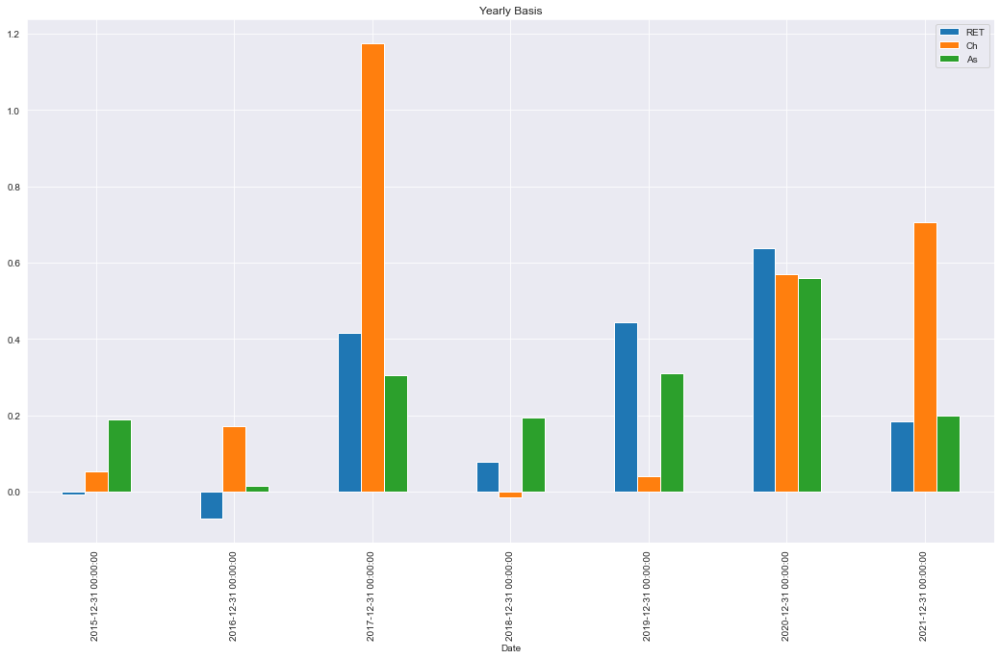

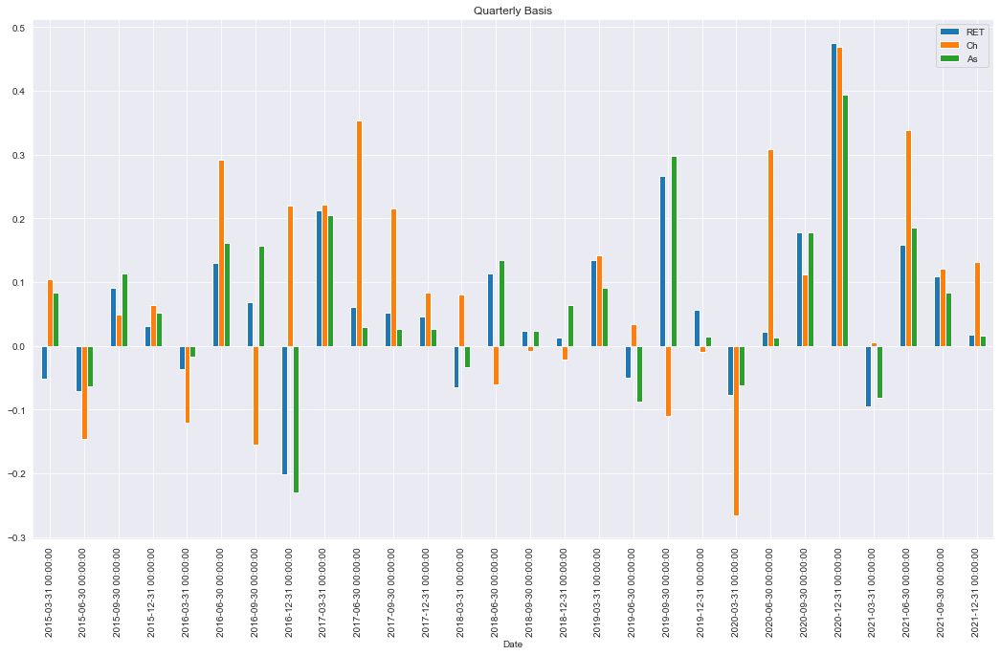

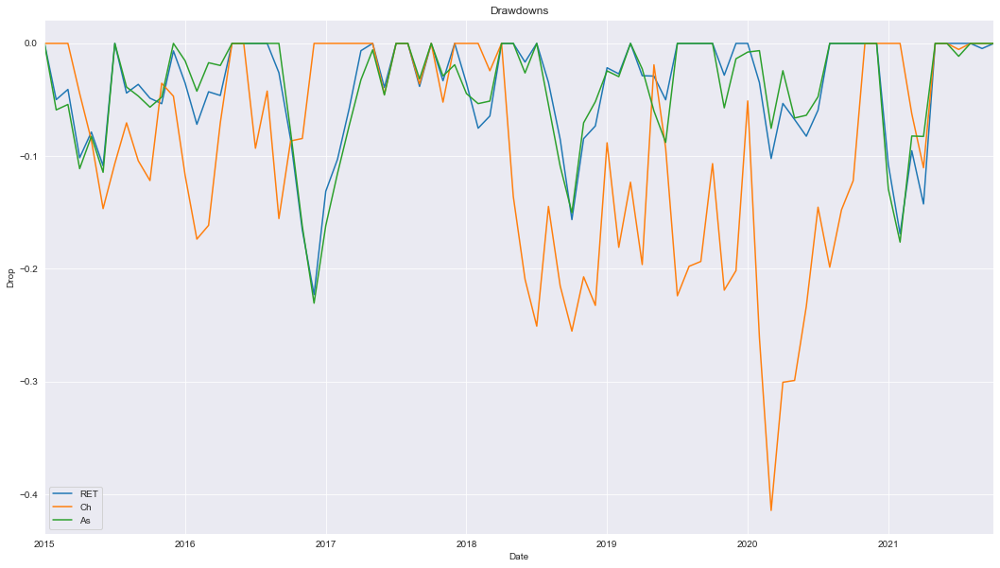

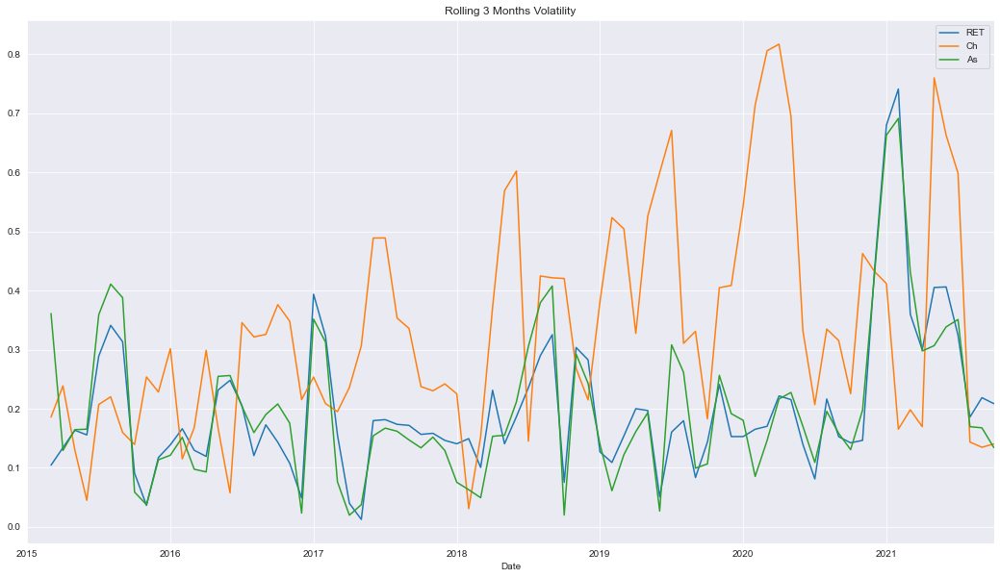

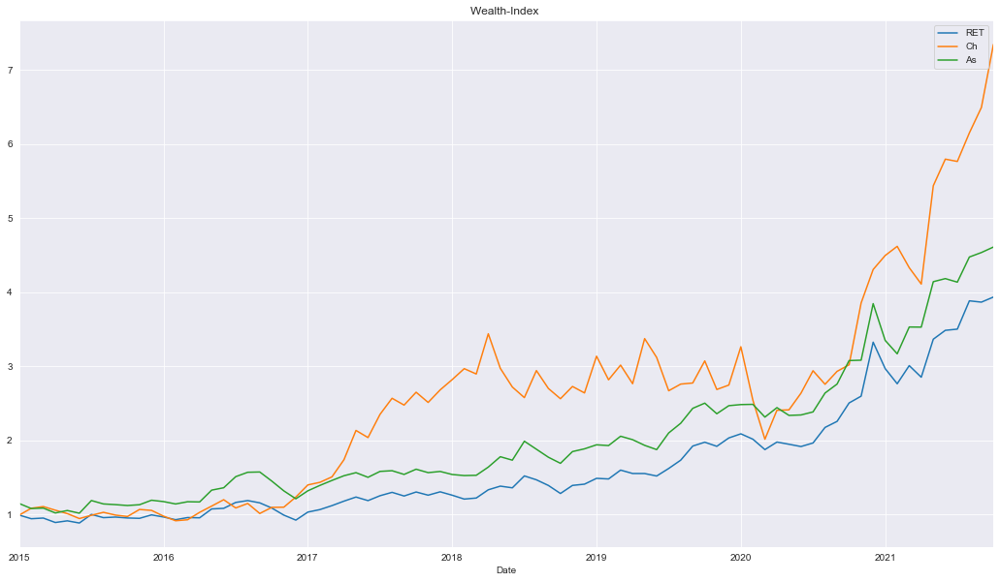

...

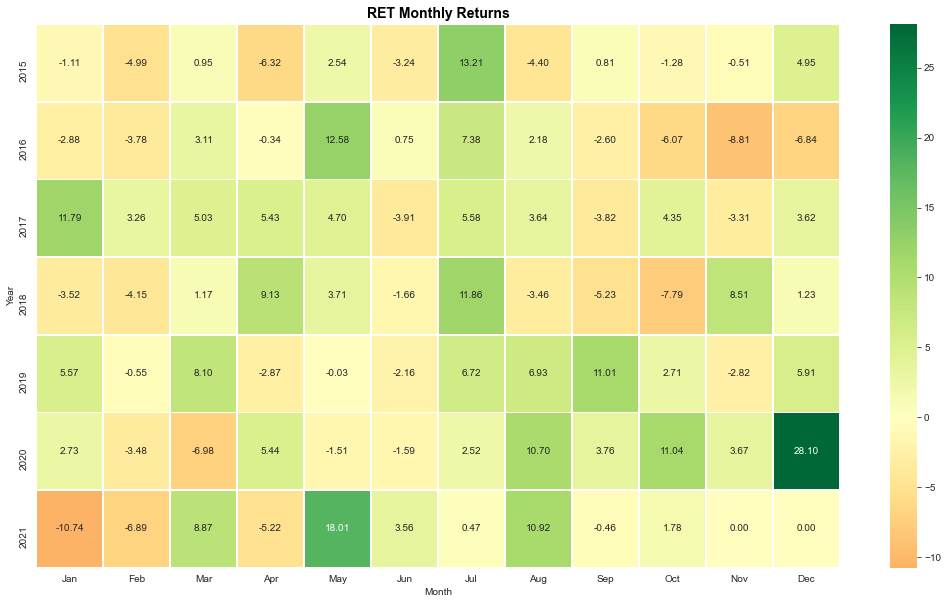

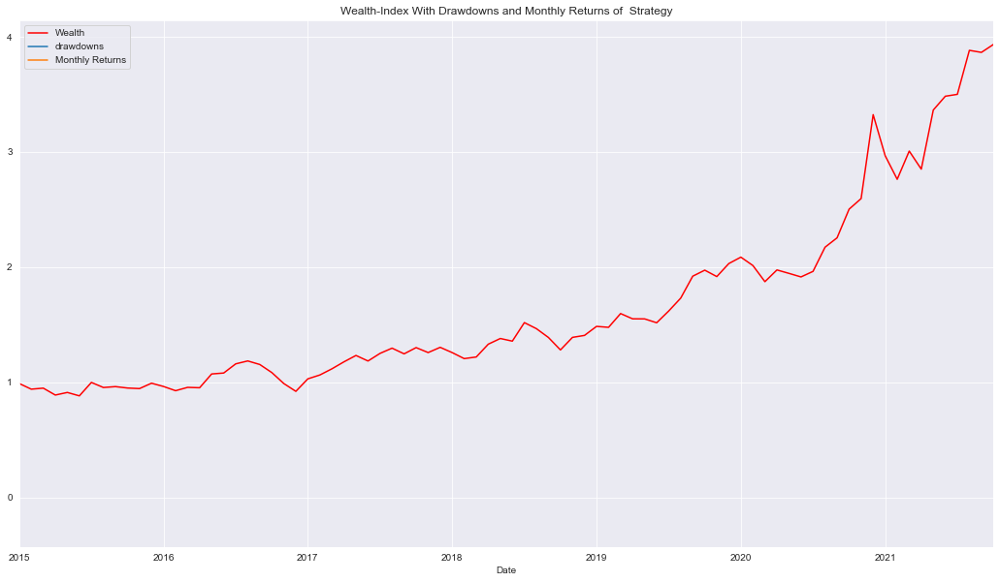

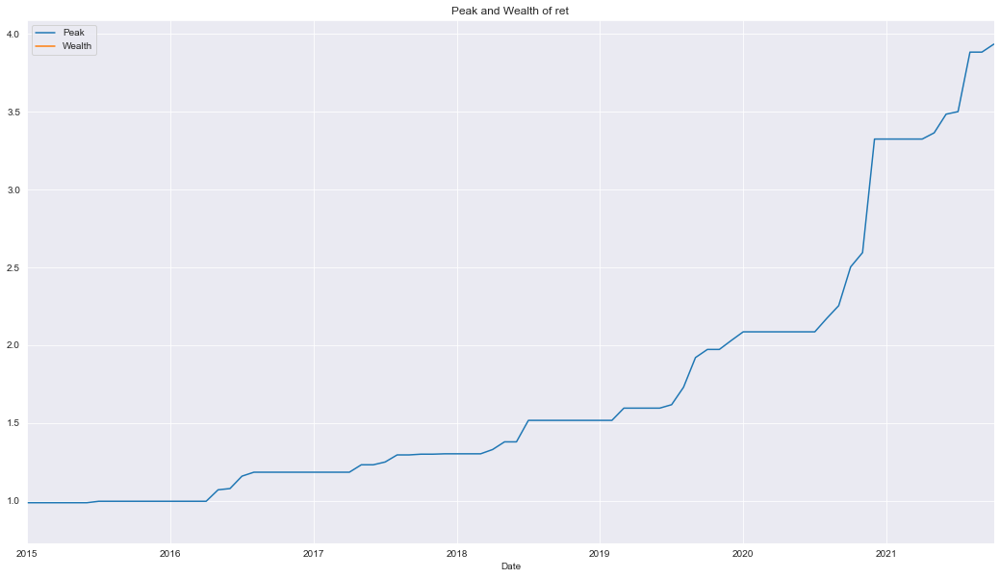

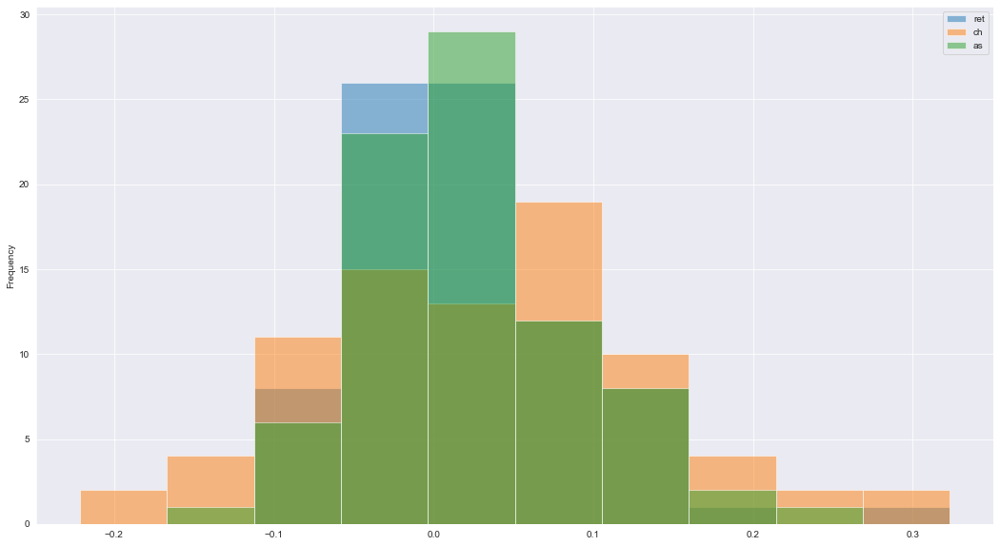

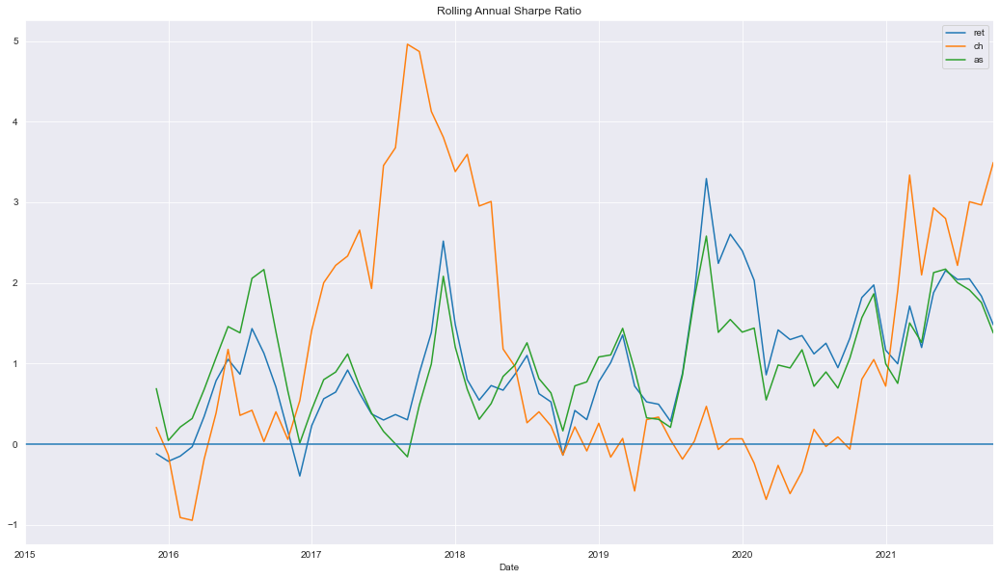

In [80]:
ts.tear_sheet(pd.concat([g_monthly,stock_1,stock_2],axis=1))

## Testing with Commodity

In [113]:
commodity=pd.read_csv("D:/CRUDEOIL-1-MCX.csv")
commodity=commodity.drop(labels=['<ticker>','<name>','<open>','<high>','<low>','<volume>'],axis=1)
commodity.index=commodity['<date>']
future_frame=commodity[['<close>']]

In [117]:
future_frame.index=pd.to_datetime(future_frame.index)

In [118]:
future_frame=future_frame.loc[data.index[0]:data.index[-1]]

In [120]:
future_frame_returns=future_frame.pct_change().dropna()

In [123]:
future_concat=pd.concat([future_frame_returns,stock_1_ret],axis=1)

In [126]:
future_concat=future_concat.dropna()

In [128]:
future_concat.columns=['Oil','Ch']

In [129]:
future_concat

,Oil,Ch
2015-01-02,-0.002647,0.011438
2015-01-05,-0.051902,-0.007270
2015-01-06,-0.045412,-0.026037
2015-01-07,0.002607,0.007519
2015-01-08,-0.007150,0.015755
...,...,...
2021-07-27,-0.004108,-0.036539
2021-07-28,0.012936,-0.010179
2021-07-29,0.008144,-0.005308
2021-07-30,0.012851,0.017009


In [140]:
df_frame=pd.DataFrame()

In [141]:
for steps in range(len(future_concat)-15):
    sample_01=future_concat[['Oil']].iloc[steps:steps+15]
    sample_02=future_concat[['Ch']].iloc[steps:steps+15]
    Model01=arch_model(sample_01,p=2,q=2)
    Model02=arch_model(sample_02,p=2,q=2)
    fit_01=Model01.fit()
    fit_02=Model02.fit()
    Vol01=pd.DataFrame({"vol":np.sqrt(fit_01.conditional_volatility)})
    Vol02=pd.DataFrame({"vol":np.sqrt(fit_02.conditional_volatility)})
    concat1=pd.concat([Vol01,Vol02],axis=1)
    concat1.columns=['Oil','Ch']
    w_1c=ratio(concat1)
    w_11=weights(w_1c)
    df_frame=df_frame.append(w_11)

Iteration:      1,   Func. Count:      8,   Neg. LLF: 632591175248.731
Iteration:      2,   Func. Count:     20,   Neg. LLF: 73.66736327417787
Iteration:      3,   Func. Count:     29,   Neg. LLF: -36.63167746275516
Iteration:      4,   Func. Count:     36,   Neg. LLF: -36.809720702848885
Iteration:      5,   Func. Count:     43,   Neg. LLF: -36.82691715172272
Iteration:      6,   Func. Count:     50,   Neg. LLF: -36.829598292031584
Iteration:      7,   Func. Count:     57,   Neg. LLF: -36.82970724919157
Iteration:      8,   Func. Count:     63,   Neg. LLF: -36.829707249245665
Optimization terminated successfully    (Exit mode 0)
            Current function value: -36.82970724919157
            Iterations: 8
            Function evaluations: 63
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      8,   Neg. LLF: 9145.004875104001
Iteration:      2,   Func. Count:     19,   Neg. LLF: -15.912767176619624
Iteration:      3,   Func. Count:     30,   Neg. LLF: -37.8957

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     19,   Neg. LLF: 1041.485761592446
Iteration:      3,   Func. Count:     27,   Neg. LLF: 110.69533934320857
Iteration:      4,   Func. Count:     35,   Neg. LLF: -32.02548083873886
Iteration:      5,   Func. Count:     42,   Neg. LLF: -30.879352628069967
Iteration:      6,   Func. Count:     51,   Neg. LLF: 3638930305.4594235
Iteration:      7,   Func. Count:     62,   Neg. LLF: 871.791606411627
Iteration:      8,   Func. Count:     71,   Neg. LLF: -21.734997560678472
Iteration:      9,   Func. Count:     79,   Neg. LLF: 1605.0256459437512
Iteration:     10,   Func. Count:     91,   Neg. LLF: -34.27646617375507
Iteration:     11,   Func. Count:     98,   Neg. LLF: -32.16239968354422
Iteration:     12,   Func. Count:    108,   Neg. LLF: 330396.8892517399
Iteration:     13,   Func. Count:    121,   Neg. LLF: -30.910934097548793
Iteration:     14,   Func. Count:    130,   Neg. LLF: 161377.61078486955
Iteration:     15,   Func. Count:    142,   Neg. LLF

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     12,   Func. Count:     95,   Neg. LLF: -40.991865294533255
Iteration:     13,   Func. Count:    102,   Neg. LLF: -40.99200859763606
Iteration:     14,   Func. Count:    109,   Neg. LLF: -40.992019671376504
Iteration:     15,   Func. Count:    115,   Neg. LLF: -40.992019671274974
Optimization terminated successfully    (Exit mode 0)
            Current function value: -40.992019671376504
            Iterations: 15
            Function evaluations: 115
            Gradient evaluations: 15
Iteration:      1,   Func. Count:      8,   Neg. LLF: 79.77137220475578
Iteration:      2,   Func. Count:     18,   Neg. LLF: 8.261371608201124
Iteration:      3,   Func. Count:     28,   Neg. LLF: -39.84484954166994
Iteration:      4,   Func. Count:     35,   Neg. LLF: -39.72036517867909
Iteration:      5,   Func. Count:     43,   Neg. LLF: 391.9860621549894
Iteration:      6,   Func. Count:     52,   Neg. LLF: -41.086275240664726
Iteration:      7,   Func. Count:     59,   Neg. LLF: -41

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     20,   Neg. LLF: 6201477.898259146
Iteration:      3,   Func. Count:     29,   Neg. LLF: -41.35973193537179
Iteration:      4,   Func. Count:     37,   Neg. LLF: -41.38146328400991
Iteration:      5,   Func. Count:     45,   Neg. LLF: -41.39886353240048
Iteration:      6,   Func. Count:     52,   Neg. LLF: -41.39875526910911
Iteration:      7,   Func. Count:     60,   Neg. LLF: -41.39961961139201
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.39979586729291
            Iterations: 7
            Function evaluations: 70
            Gradient evaluations: 7
Iteration:      1,   Func. Count:      8,   Neg. LLF: 76642644.83090591
Iteration:      2,   Func. Count:     20,   Neg. LLF: 5534.450054449312
Iteration:      3,   Func. Count:     29,   Neg. LLF: -39.414135438639846
Iteration:      4,   Func. Count:     36,   Neg. LLF: -39.41618793550299
Iteration:      5,   Func. Count:     43,   Neg. LLF: -39.41936

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 20216.340485650995
Iteration:      2,   Func. Count:     20,   Neg. LLF: -17.659310272282664
Iteration:      3,   Func. Count:     31,   Neg. LLF: -39.185938071684355
Iteration:      4,   Func. Count:     38,   Neg. LLF: -39.203426865830856
Iteration:      5,   Func. Count:     46,   Neg. LLF: -39.26916770459225
Iteration:      6,   Func. Count:     53,   Neg. LLF: -39.26921457770101
Iteration:      7,   Func. Count:     60,   Neg. LLF: -39.26921743515741
Iteration:      8,   Func. Count:     67,   Neg. LLF: -39.26923624851254
Iteration:      9,   Func. Count:     74,   Neg. LLF: -39.26950527807236
Iteration:     10,   Func. Count:     81,   Neg. LLF: -39.2885365091417
Iteration:     11,   Func. Count:     88,   Neg. LLF: -39.28844017433723
Iteration:     12,   Func. Count:     96,   Neg. LLF: -39.28859415484739
Iteration:     13,   Func. Count:    102,   Neg. LLF: -39.2885941665546
Optimization terminated successfully    (Exit mode

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     20,   Neg. LLF: 29031818057.71593
Iteration:      3,   Func. Count:     32,   Neg. LLF: 311431660397.337
Iteration:      4,   Func. Count:     44,   Neg. LLF: 17793.270085085212
Iteration:      5,   Func. Count:     53,   Neg. LLF: -39.32366409064671
Iteration:      6,   Func. Count:     61,   Neg. LLF: 398355.96169826173
Iteration:      7,   Func. Count:     73,   Neg. LLF: 1.9110972642212483
Iteration:      8,   Func. Count:     81,   Neg. LLF: -36.23195309632254
Iteration:      9,   Func. Count:     89,   Neg. LLF: -42.223375581979354
Iteration:     10,   Func. Count:     97,   Neg. LLF: -43.30070807553638
Iteration:     11,   Func. Count:    105,   Neg. LLF: -42.44442326466975
Iteration:     12,   Func. Count:    113,   Neg. LLF: 10618011.853806574
Iteration:     13,   Func. Count:    125,   Neg. LLF: 36752.609384596326
Iteration:     14,   Func. Count:    133,   Neg. LLF: -43.57758895222403
Optimization terminated successfully    (Exit mode 0

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     20,   Neg. LLF: -10.824494958821656
Iteration:      3,   Func. Count:     28,   Neg. LLF: -28.189195385304206
Iteration:      4,   Func. Count:     36,   Neg. LLF: 389008.6354679741
Iteration:      5,   Func. Count:     48,   Neg. LLF: -40.46457688287923
Iteration:      6,   Func. Count:     55,   Neg. LLF: -36.8905510673008
Iteration:      7,   Func. Count:     67,   Neg. LLF: 19155382.570755057
Iteration:      8,   Func. Count:     81,   Neg. LLF: 3.9656536206138946
Iteration:      9,   Func. Count:     92,   Neg. LLF: -20.300887904814214
Iteration:     10,   Func. Count:    102,   Neg. LLF: 66828652.903972104
Iteration:     11,   Func. Count:    115,   Neg. LLF: 47.42492941237918
Iteration:     12,   Func. Count:    126,   Neg. LLF: 59189.99071260488
Iteration:     13,   Func. Count:    138,   Neg. LLF: -40.65589377834883
Optimization terminated successfully    (Exit mode 0)
            Current function value: -40.65589383292494
            Ite

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     21,   Neg. LLF: 481.1941843860473
Iteration:      3,   Func. Count:     29,   Neg. LLF: -43.906471770862524
Iteration:      4,   Func. Count:     39,   Neg. LLF: -10.188394619876327
Iteration:      5,   Func. Count:     47,   Neg. LLF: -48.77049181735768
Iteration:      6,   Func. Count:     55,   Neg. LLF: -49.8723535539448
Iteration:      7,   Func. Count:     62,   Neg. LLF: -49.81238428490004
Iteration:      8,   Func. Count:     70,   Neg. LLF: -49.130059595311586
Iteration:      9,   Func. Count:     78,   Neg. LLF: -49.79489230237308
Iteration:     10,   Func. Count:     86,   Neg. LLF: -49.90251906989055
Iteration:     11,   Func. Count:     94,   Neg. LLF: -49.95136305981268
Iteration:     12,   Func. Count:    101,   Neg. LLF: -49.953446035897244
Iteration:     13,   Func. Count:    108,   Neg. LLF: -49.95378711908904
Iteration:     14,   Func. Count:    115,   Neg. LLF: -49.9538399252297
Iteration:     15,   Func. Count:    122,   Neg. 

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 21806.290897035782
Iteration:      2,   Func. Count:     20,   Neg. LLF: -17.2651524148279
Iteration:      3,   Func. Count:     31,   Neg. LLF: -38.855006102829805
Iteration:      4,   Func. Count:     38,   Neg. LLF: -38.92260238477045
Iteration:      5,   Func. Count:     45,   Neg. LLF: -37.67771339522291
Iteration:      6,   Func. Count:     53,   Neg. LLF: -39.00789961892416
Iteration:      7,   Func. Count:     60,   Neg. LLF: -39.394455511007756
Iteration:      8,   Func. Count:     67,   Neg. LLF: -20.984867497308937
Iteration:      9,   Func. Count:     75,   Neg. LLF: -35.47143185294561
Iteration:     10,   Func. Count:     83,   Neg. LLF: -39.67588718697284
Iteration:     11,   Func. Count:     90,   Neg. LLF: -39.74111500825786
Iteration:     12,   Func. Count:     97,   Neg. LLF: -39.79091384508469
Iteration:     13,   Func. Count:    104,   Neg. LLF: -39.83259838823328
Iteration:     14,   Func. Count:    111,   Neg. 

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     20,   Neg. LLF: -21.32024105450617
Iteration:      3,   Func. Count:     31,   Neg. LLF: -43.520639543966865
Iteration:      4,   Func. Count:     39,   Neg. LLF: -43.647586137678914
Iteration:      5,   Func. Count:     47,   Neg. LLF: -43.824313017632896
Iteration:      6,   Func. Count:     54,   Neg. LLF: -43.766940620198056
Iteration:      7,   Func. Count:     62,   Neg. LLF: -44.01574481196453
Iteration:      8,   Func. Count:     69,   Neg. LLF: -44.02087736941826
Iteration:      9,   Func. Count:     76,   Neg. LLF: -44.026338182755005
Iteration:     10,   Func. Count:     83,   Neg. LLF: -44.027633109917595
Iteration:     11,   Func. Count:     90,   Neg. LLF: -44.027891140790935
Iteration:     12,   Func. Count:     97,   Neg. LLF: -44.02789649849084
Iteration:     13,   Func. Count:    103,   Neg. LLF: -44.0278965150984
Optimization terminated successfully    (Exit mode 0)
            Current function value: -44.02789649849084
        

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     19,   Neg. LLF: -47.42760617737382
Optimization terminated successfully    (Exit mode 0)
            Current function value: -47.42760622589487
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      8,   Neg. LLF: 3218.3965668354826
Iteration:      2,   Func. Count:     20,   Neg. LLF: -25.859798873016544
Iteration:      3,   Func. Count:     28,   Neg. LLF: -9.523805441824837
Iteration:      4,   Func. Count:     36,   Neg. LLF: -41.06916253124258
Iteration:      5,   Func. Count:     43,   Neg. LLF: -41.07231352467191
Iteration:      6,   Func. Count:     50,   Neg. LLF: -41.075036405056395
Iteration:      7,   Func. Count:     57,   Neg. LLF: 3054.8606416847674
Iteration:      8,   Func. Count:     69,   Neg. LLF: -29.945314187831144
Iteration:      9,   Func. Count:     80,   Neg. LLF: -39.14520486307483
Iteration:     10,   Func. Count:     89,   Neg. LLF: -41.

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      6,   Func. Count:     52,   Neg. LLF: -42.68825579965782
Iteration:      7,   Func. Count:     59,   Neg. LLF: -42.738358306791454
Iteration:      8,   Func. Count:     66,   Neg. LLF: -42.74833233782805
Iteration:      9,   Func. Count:     73,   Neg. LLF: -42.752700205430344
Iteration:     10,   Func. Count:     80,   Neg. LLF: -42.75305548975805
Iteration:     11,   Func. Count:     87,   Neg. LLF: -42.75310378033506
Iteration:     12,   Func. Count:     93,   Neg. LLF: -42.75310375439445
Optimization terminated successfully    (Exit mode 0)
            Current function value: -42.75310378033506
            Iterations: 12
            Function evaluations: 93
            Gradient evaluations: 12
Iteration:      1,   Func. Count:      8,   Neg. LLF: 22719.46078284633
Iteration:      2,   Func. Count:     20,   Neg. LLF: -33.62633364517246
Iteration:      3,   Func. Count:     31,   Neg. LLF: 2847.6089401577165
Iteration:      4,   Func. Count:     39,   Neg. LLF: -49.

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      1,   Func. Count:      8,   Neg. LLF: 8420797.431516338
Iteration:      2,   Func. Count:     20,   Neg. LLF: 598196.0196272826
Iteration:      3,   Func. Count:     32,   Neg. LLF: -44.97721411617812
Iteration:      4,   Func. Count:     41,   Neg. LLF: -14.30554163404647
Iteration:      5,   Func. Count:     49,   Neg. LLF: -47.779528655494936
Iteration:      6,   Func. Count:     57,   Neg. LLF: -47.98821358366932
Iteration:      7,   Func. Count:     64,   Neg. LLF: -47.90303569051753
Iteration:      8,   Func. Count:     72,   Neg. LLF: -47.9936417697024
Iteration:      9,   Func. Count:     80,   Neg. LLF: -47.931817452884516
Iteration:     10,   Func. Count:     88,   Neg. LLF: 30650098.831048675
Iteration:     11,   Func. Count:    101,   Neg. LLF: 627309.1244988798
Iteration:     12,   Func. Count:    110,   Neg. LLF: -47.777607534875344
Iteration:     13,   Func. Count:    118,   Neg. LLF: -47.98239343622313
Iteration:     14,   Func. Count:    126,   Neg. LLF

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      3,   Func. Count:     31,   Neg. LLF: -41.206467663259836
Iteration:      4,   Func. Count:     39,   Neg. LLF: -41.20239575003579
Iteration:      5,   Func. Count:     47,   Neg. LLF: -41.25940458948763
Iteration:      6,   Func. Count:     54,   Neg. LLF: -41.25863554899706
Iteration:      7,   Func. Count:     62,   Neg. LLF: -41.26028581331244
Iteration:      8,   Func. Count:     70,   Neg. LLF: -41.26047364047565
Iteration:      9,   Func. Count:     77,   Neg. LLF: -41.26058494207365
Iteration:     10,   Func. Count:     84,   Neg. LLF: -41.26132379302423
Iteration:     11,   Func. Count:     91,   Neg. LLF: -41.266616624008215
Iteration:     12,   Func. Count:     98,   Neg. LLF: -41.26661051331097
Iteration:     13,   Func. Count:    106,   Neg. LLF: -41.26662236008796
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.26662236008796
            Iterations: 13
            Function evaluations: 106
            Gradient

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     10,   Func. Count:     80,   Neg. LLF: -28.093577976784687
Iteration:     11,   Func. Count:     87,   Neg. LLF: -28.095751451184043
Iteration:     12,   Func. Count:     94,   Neg. LLF: -28.096989071192045
Iteration:     13,   Func. Count:    101,   Neg. LLF: -28.097389904976602
Iteration:     14,   Func. Count:    108,   Neg. LLF: -28.097392672635213
Iteration:     15,   Func. Count:    115,   Neg. LLF: -28.097395588764083
Iteration:     16,   Func. Count:    121,   Neg. LLF: -28.097395588234154
Optimization terminated successfully    (Exit mode 0)
            Current function value: -28.097395588764083
            Iterations: 16
            Function evaluations: 121
            Gradient evaluations: 16
Iteration:      1,   Func. Count:      8,   Neg. LLF: 4791.603586974073
Iteration:      2,   Func. Count:     20,   Neg. LLF: -26.83252795181091
Iteration:      3,   Func. Count:     31,   Neg. LLF: 51.92210298650897
Iteration:      4,   Func. Count:     39,   Neg. LLF

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     19,   Neg. LLF: -8.652211562388104
Iteration:      3,   Func. Count:     30,   Neg. LLF: -30.766312701435325
Iteration:      4,   Func. Count:     37,   Neg. LLF: -30.029784009945434
Iteration:      5,   Func. Count:     45,   Neg. LLF: -30.858344750938606
Iteration:      6,   Func. Count:     52,   Neg. LLF: -30.86509715319951
Iteration:      7,   Func. Count:     59,   Neg. LLF: -30.86599303240478
Iteration:      8,   Func. Count:     66,   Neg. LLF: -30.8706678186545
Iteration:      9,   Func. Count:     73,   Neg. LLF: -30.877718557206286
Iteration:     10,   Func. Count:     80,   Neg. LLF: -30.904021736303704
Iteration:     11,   Func. Count:     87,   Neg. LLF: -30.91596566160912
Iteration:     12,   Func. Count:     94,   Neg. LLF: -30.917025306792596
Iteration:     13,   Func. Count:    101,   Neg. LLF: 101.62180623625838
Iteration:     14,   Func. Count:    113,   Neg. LLF: -27.27117392428634
Iteration:     15,   Func. Count:    123,   Ne

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     11,   Func. Count:     96,   Neg. LLF: -45.63622036027473
Iteration:     12,   Func. Count:    103,   Neg. LLF: -45.63623075122293
Iteration:     13,   Func. Count:    109,   Neg. LLF: -45.636230594958135
Optimization terminated successfully    (Exit mode 0)
            Current function value: -45.63623075122293
            Iterations: 14
            Function evaluations: 109
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      8,   Neg. LLF: 20057240895.165478
Iteration:      2,   Func. Count:     19,   Neg. LLF: 6940672.870243616
Iteration:      3,   Func. Count:     28,   Neg. LLF: -34.66176306081514
Iteration:      4,   Func. Count:     35,   Neg. LLF: -34.73654604806809
Iteration:      5,   Func. Count:     42,   Neg. LLF: -34.747006072316225
Iteration:      6,   Func. Count:     49,   Neg. LLF: -34.752442461907926
Iteration:      7,   Func. Count:     56,   Neg. LLF: -34.76850004043966
Iteration:      8,   Func. Count:     63,   Neg. LLF: -34

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      9,   Func. Count:     71,   Neg. LLF: -38.91350534681741
Iteration:     10,   Func. Count:     78,   Neg. LLF: -38.91369381535938
Iteration:     11,   Func. Count:     85,   Neg. LLF: -38.91478382958501
Iteration:     12,   Func. Count:     92,   Neg. LLF: -38.918735785945564
Iteration:     13,   Func. Count:     99,   Neg. LLF: -38.91873690380961
Iteration:     14,   Func. Count:    107,   Neg. LLF: -38.91869625700235
Optimization terminated successfully    (Exit mode 0)
            Current function value: -38.918748377054534
            Iterations: 14
            Function evaluations: 117
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      8,   Neg. LLF: 9666787.087902183
Iteration:      2,   Func. Count:     19,   Neg. LLF: -41.47852879952818
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.47852885456852
            Iterations: 6
            Function evaluations: 19
            Gradient evaluation

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     29,   Neg. LLF: -36.75137429404794
Iteration:      4,   Func. Count:     36,   Neg. LLF: -36.54312278589481
Iteration:      5,   Func. Count:     44,   Neg. LLF: 3800014.4141265396
Iteration:      6,   Func. Count:     56,   Neg. LLF: 10170.328832120336
Iteration:      7,   Func. Count:     66,   Neg. LLF: -36.77087216204013
Iteration:      8,   Func. Count:     73,   Neg. LLF: -23.51037593003297
Optimization terminated successfully    (Exit mode 0)
            Current function value: -36.7708721742262
            Iterations: 10
            Function evaluations: 78
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      8,   Neg. LLF: 121779.84368759356
Iteration:      2,   Func. Count:     20,   Neg. LLF: 143.74263909664853
Iteration:      3,   Func. Count:     28,   Neg. LLF: 143.6218058749883
Iteration:      4,   Func. Count:     36,   Neg. LLF: -33.92797163887115
Iteration:      5,   Func. Count:     43,   Neg. LLF: -34.02818

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:     18,   Func. Count:    140,   Neg. LLF: -41.56782801996987
Iteration:     19,   Func. Count:    146,   Neg. LLF: -41.56782802003765
Optimization terminated successfully    (Exit mode 0)
            Current function value: -41.56782801996987
            Iterations: 19
            Function evaluations: 146
            Gradient evaluations: 19
Iteration:      1,   Func. Count:      8,   Neg. LLF: 19237575.416936364
Iteration:      2,   Func. Count:     20,   Neg. LLF: 6669393.726161419
Iteration:      3,   Func. Count:     28,   Neg. LLF: -9.861066343141477
Iteration:      4,   Func. Count:     36,   Neg. LLF: -38.08807436008049
Iteration:      5,   Func. Count:     44,   Neg. LLF: -34.64580835506362
Iteration:      6,   Func. Count:     52,   Neg. LLF: -37.224436221258706
Iteration:      7,   Func. Count:     60,   Neg. LLF: -41.411629616940985
Iteration:      8,   Func. Count:     67,   Neg. LLF: -10.402014497094335
Iteration:      9,   Func. Count:     76,   Neg. LLF: -2

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      4,   Func. Count:     35,   Neg. LLF: -35.4920265925979
Iteration:      5,   Func. Count:     43,   Neg. LLF: -35.60486953083516
Iteration:      6,   Func. Count:     50,   Neg. LLF: -35.606971911340025
Iteration:      7,   Func. Count:     57,   Neg. LLF: -35.598760356542336
Iteration:      8,   Func. Count:     65,   Neg. LLF: -35.609023537919214
Iteration:      9,   Func. Count:     72,   Neg. LLF: -35.609048342250674
Iteration:     10,   Func. Count:     79,   Neg. LLF: -35.60905063761064
Iteration:     11,   Func. Count:     85,   Neg. LLF: -35.6090506375797
Optimization terminated successfully    (Exit mode 0)
            Current function value: -35.60905063761064
            Iterations: 11
            Function evaluations: 85
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      8,   Neg. LLF: 2735.9669120026642
Iteration:      2,   Func. Count:     20,   Neg. LLF: -19.879300236157825
Iteration:      3,   Func. Count:     31,   Neg. LLF: -4

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      5,   Func. Count:     44,   Neg. LLF: -5.9725724670742615
Iteration:      6,   Func. Count:     51,   Neg. LLF: -5.972856364152653
Iteration:      7,   Func. Count:     58,   Neg. LLF: -5.972880905196827
Iteration:      8,   Func. Count:     65,   Neg. LLF: -5.97305252539343
Iteration:      9,   Func. Count:     72,   Neg. LLF: -5.976200303172405
Iteration:     10,   Func. Count:     79,   Neg. LLF: -5.996470486721627
Iteration:     11,   Func. Count:     86,   Neg. LLF: -5.996533131873832
Iteration:     12,   Func. Count:     93,   Neg. LLF: -5.996541501192491
Iteration:     13,   Func. Count:     99,   Neg. LLF: -5.996541510822704
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.996541501192491
            Iterations: 13
            Function evaluations: 99
            Gradient evaluations: 13
Iteration:      1,   Func. Count:      8,   Neg. LLF: 11852.768313234516
Iteration:      2,   Func. Count:     19,   Neg. LLF: 273.1

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     19,   Neg. LLF: 619.2062525958647
Iteration:      3,   Func. Count:     27,   Neg. LLF: -24.192987459961593
Iteration:      4,   Func. Count:     35,   Neg. LLF: -21.33560869035707
Iteration:      5,   Func. Count:     43,   Neg. LLF: -22.515940447308623
Iteration:      6,   Func. Count:     51,   Neg. LLF: 19.498844415536173
Iteration:      7,   Func. Count:     59,   Neg. LLF: 1989.5064779573197
Iteration:      8,   Func. Count:     67,   Neg. LLF: -30.07215374109592
Iteration:      9,   Func. Count:     74,   Neg. LLF: 1.4246412638827195
Iteration:     10,   Func. Count:     82,   Neg. LLF: -29.130285775319443
Iteration:     11,   Func. Count:     90,   Neg. LLF: 3.035154905658236
Iteration:     12,   Func. Count:     98,   Neg. LLF: -26.95656324049696
Iteration:     13,   Func. Count:    106,   Neg. LLF: -32.03938895340091
Iteration:     14,   Func. Count:    113,   Neg. LLF: -21.342411789032216
Iteration:     15,   Func. Count:    124,   Neg.

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      2,   Func. Count:     20,   Neg. LLF: 7739273.026485813
Iteration:      3,   Func. Count:     29,   Neg. LLF: -43.89896087382236
Iteration:      4,   Func. Count:     36,   Neg. LLF: -43.51543453470394
Iteration:      5,   Func. Count:     45,   Neg. LLF: -43.92283693691198
Iteration:      6,   Func. Count:     52,   Neg. LLF: -44.56803580552826
Iteration:      7,   Func. Count:     59,   Neg. LLF: -32.95440683566279
Iteration:      8,   Func. Count:     67,   Neg. LLF: -43.46423717985741
Iteration:      9,   Func. Count:     75,   Neg. LLF: -44.99846917400715
Iteration:     10,   Func. Count:     82,   Neg. LLF: -44.9912503689894
Iteration:     11,   Func. Count:     90,   Neg. LLF: -45.14128926336414
Iteration:     12,   Func. Count:     97,   Neg. LLF: -45.1427573880408
Iteration:     13,   Func. Count:    104,   Neg. LLF: -45.14281304503236
Iteration:     14,   Func. Count:    111,   Neg. LLF: -45.142813465338705
Optimization terminated successfully    (Exit mode 0)

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      4,   Func. Count:     39,   Neg. LLF: -38.00348475477388
Iteration:      5,   Func. Count:     47,   Neg. LLF: 903.2836775350785
Iteration:      6,   Func. Count:     58,   Neg. LLF: 521863.06198407547
Iteration:      7,   Func. Count:     70,   Neg. LLF: 144.40232226159094
Iteration:      8,   Func. Count:     78,   Neg. LLF: 0.6815265262509
Iteration:      9,   Func. Count:     86,   Neg. LLF: -21.251715962003605
Iteration:     10,   Func. Count:     94,   Neg. LLF: -44.65641316452189
Iteration:     11,   Func. Count:    101,   Neg. LLF: -17.412838828689253
Iteration:     12,   Func. Count:    112,   Neg. LLF: 35514379.80221661
Iteration:     13,   Func. Count:    125,   Neg. LLF: -18.594228156760376
Iteration:     14,   Func. Count:    136,   Neg. LLF: -47.24683907533918
Iteration:     15,   Func. Count:    143,   Neg. LLF: 690751847.9478574
Iteration:     16,   Func. Count:    156,   Neg. LLF: 32919.80127356798
Iteration:     17,   Func. Count:    167,   Neg. LLF: 6

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      4,   Func. Count:     37,   Neg. LLF: -34.795052150715854
Iteration:      5,   Func. Count:     44,   Neg. LLF: -34.795222434525556
Iteration:      6,   Func. Count:     52,   Neg. LLF: -34.79697293085358
Iteration:      7,   Func. Count:     59,   Neg. LLF: -34.79789699769674
Iteration:      8,   Func. Count:     66,   Neg. LLF: -34.79812274657645
Iteration:      9,   Func. Count:     73,   Neg. LLF: -34.79871129872373
Iteration:     10,   Func. Count:     80,   Neg. LLF: -34.7999369896563
Iteration:     11,   Func. Count:     87,   Neg. LLF: -34.8012605215926
Iteration:     12,   Func. Count:     94,   Neg. LLF: -34.80496573655049
Iteration:     13,   Func. Count:    101,   Neg. LLF: -34.80438606042283
Iteration:     14,   Func. Count:    109,   Neg. LLF: -34.80559012821472
Iteration:     15,   Func. Count:    116,   Neg. LLF: -34.80559469936098
Iteration:     16,   Func. Count:    122,   Neg. LLF: -34.80559469885178
Optimization terminated successfully    (Exit mode

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:     13,   Func. Count:    105,   Neg. LLF: -44.58257125955221
Iteration:     14,   Func. Count:    111,   Neg. LLF: -44.58257126546943
Optimization terminated successfully    (Exit mode 0)
            Current function value: -44.58257125955221
            Iterations: 14
            Function evaluations: 111
            Gradient evaluations: 14
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1108504396147.0015
Iteration:      2,   Func. Count:     20,   Neg. LLF: -18.39377734678133
Iteration:      3,   Func. Count:     28,   Neg. LLF: -25.23975455596018
Iteration:      4,   Func. Count:     36,   Neg. LLF: -26.78609315834493
Iteration:      5,   Func. Count:     44,   Neg. LLF: -31.641686417577578
Iteration:      6,   Func. Count:     52,   Neg. LLF: -32.745807072788054
Iteration:      7,   Func. Count:     60,   Neg. LLF: -31.711221544604346
Iteration:      8,   Func. Count:     68,   Neg. LLF: -32.36000656043135
Iteration:      9,   Func. Count:     76,   Neg. LLF: -3

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      2,   Func. Count:     19,   Neg. LLF: -17.74601768204434
Iteration:      3,   Func. Count:     30,   Neg. LLF: 151.93790320140675
Iteration:      4,   Func. Count:     38,   Neg. LLF: -37.41669608450177
Iteration:      5,   Func. Count:     47,   Neg. LLF: -36.819665249777906
Iteration:      6,   Func. Count:     55,   Neg. LLF: -37.64591444484472
Iteration:      7,   Func. Count:     63,   Neg. LLF: -38.38362182010984
Iteration:      8,   Func. Count:     71,   Neg. LLF: -38.381301718698
Iteration:      9,   Func. Count:     79,   Neg. LLF: -38.40700183356022
Iteration:     10,   Func. Count:     87,   Neg. LLF: -38.44803203910451
Iteration:     11,   Func. Count:     94,   Neg. LLF: -38.44813107122807
Iteration:     12,   Func. Count:    101,   Neg. LLF: -38.44813811292327
Iteration:     13,   Func. Count:    108,   Neg. LLF: -38.448145768328644
Iteration:     14,   Func. Count:    115,   Neg. LLF: -38.44814992695479
Iteration:     15,   Func. Count:    122,   Neg. L

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      3,   Func. Count:     29,   Neg. LLF: -29.085854336400658
Iteration:      4,   Func. Count:     36,   Neg. LLF: -28.929045210082233
Iteration:      5,   Func. Count:     44,   Neg. LLF: -29.118647167898807
Iteration:      6,   Func. Count:     51,   Neg. LLF: -29.11889481271873
Iteration:      7,   Func. Count:     58,   Neg. LLF: -29.118898827480876
Iteration:      8,   Func. Count:     64,   Neg. LLF: -29.11889884456998
Optimization terminated successfully    (Exit mode 0)
            Current function value: -29.118898827480876
            Iterations: 8
            Function evaluations: 64
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      8,   Neg. LLF: 2910116.0258344486
Iteration:      2,   Func. Count:     20,   Neg. LLF: -32.1687821574415
Iteration:      3,   Func. Count:     30,   Neg. LLF: -47.858308914582445
Iteration:      4,   Func. Count:     37,   Neg. LLF: -47.82224032865873
Iteration:      5,   Func. Count:     45,   Neg. LLF: -4

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(



Iteration:      7,   Func. Count:     58,   Neg. LLF: -30.720395898217006
Iteration:      8,   Func. Count:     64,   Neg. LLF: -30.720395895461717
Optimization terminated successfully    (Exit mode 0)
            Current function value: -30.720395898217006
            Iterations: 8
            Function evaluations: 64
            Gradient evaluations: 8
Iteration:      1,   Func. Count:      8,   Neg. LLF: 1197010.80325024
Iteration:      2,   Func. Count:     20,   Neg. LLF: -30.21540424878604
Iteration:      3,   Func. Count:     30,   Neg. LLF: -30.199831701372545
Iteration:      4,   Func. Count:     38,   Neg. LLF: -41.28521904827915
Iteration:      5,   Func. Count:     46,   Neg. LLF: -41.74438205697391
Iteration:      6,   Func. Count:     54,   Neg. LLF: -42.548797646259096
Iteration:      7,   Func. Count:     61,   Neg. LLF: -41.94894266591723
Iteration:      8,   Func. Count:     69,   Neg. LLF: -42.34528734911084
Iteration:      9,   Func. Count:     77,   Neg. LLF: -42.

C:\Users\Lenovo\anaconda3\lib\site-packages\arch\univariate\base.py:707: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Iteration:      3,   Func. Count:     30,   Neg. LLF: -35.46543664200852
Iteration:      4,   Func. Count:     37,   Neg. LLF: -35.42621108891308
Iteration:      5,   Func. Count:     45,   Neg. LLF: -35.556592727922244
Iteration:      6,   Func. Count:     52,   Neg. LLF: -35.5584391031667
Iteration:      7,   Func. Count:     59,   Neg. LLF: -35.564192227703856
Iteration:      8,   Func. Count:     66,   Neg. LLF: -35.58158042625201
Iteration:      9,   Func. Count:     73,   Neg. LLF: -35.581620873047605
Iteration:     10,   Func. Count:     80,   Neg. LLF: -35.581617022944286
Iteration:     11,   Func. Count:     87,   Neg. LLF: -35.58162914321465
Optimization terminated successfully    (Exit mode 0)
            Current function value: -35.581629134885866
            Iterations: 11
            Function evaluations: 87
            Gradient evaluations: 11
Iteration:      1,   Func. Count:      8,   Neg. LLF: 3192472.331902465
Iteration:      2,   Func. Count:     20,   Neg. LLF: -47

In [143]:
df_frame.index=future_concat.iloc[15:].index

In [150]:
testing_returns=future_concat.iloc[:,::-1]

In [153]:
df_frame.index=pd.to_datetime(df_frame.index)

In [155]:
testing_returns=testing_returns.loc[df_frame.index[0]:df_frame.index[-1]]

In [164]:
ff=pd.DataFrame((testing_returns * df_frame.values).sum(axis=1))

In [166]:
ff.columns=['Ret']

In [167]:
ff_monthly=ff.resample(rule='M').apply(af.compound)

In [170]:
future_concat_monthly=future_concat.resample(rule='M').apply(af.compound)

Performance Metrics: Strategies
╒════════════════════════════════════════════╤═════════════════════╤═════════════════════╤═════════════════════╕
│                                            │ ret                 │ Oil                 │ Ch                  │
╞════════════════════════════════════════════╪═════════════════════╪═════════════════════╪═════════════════════╡
│ Start-Date                                 │ 2015-01-31 00:00:00 │ 2015-01-31 00:00:00 │ 2015-01-31 00:00:00 │
├────────────────────────────────────────────┼─────────────────────┼─────────────────────┼─────────────────────┤
│ End-Date                                   │ 2021-08-31 00:00:00 │ 2021-08-31 00:00:00 │ 2021-08-31 00:00:00 │
├────────────────────────────────────────────┼─────────────────────┼─────────────────────┼─────────────────────┤
│ Total-Months-Tested                        │ 80                  │ 80                  │ 80                  │
├────────────────────────────────────────────┼──────────────────

0

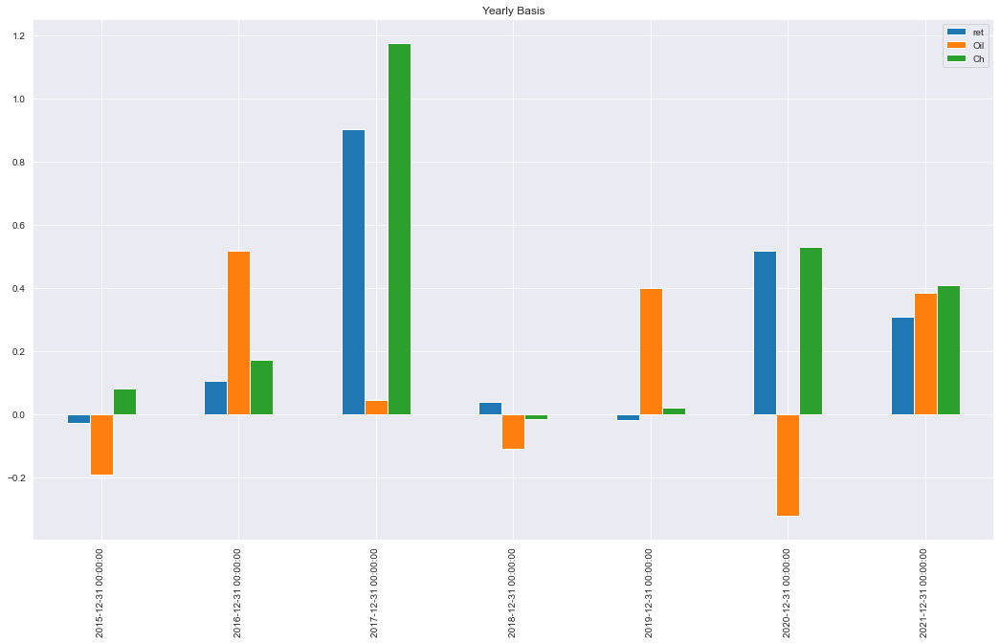

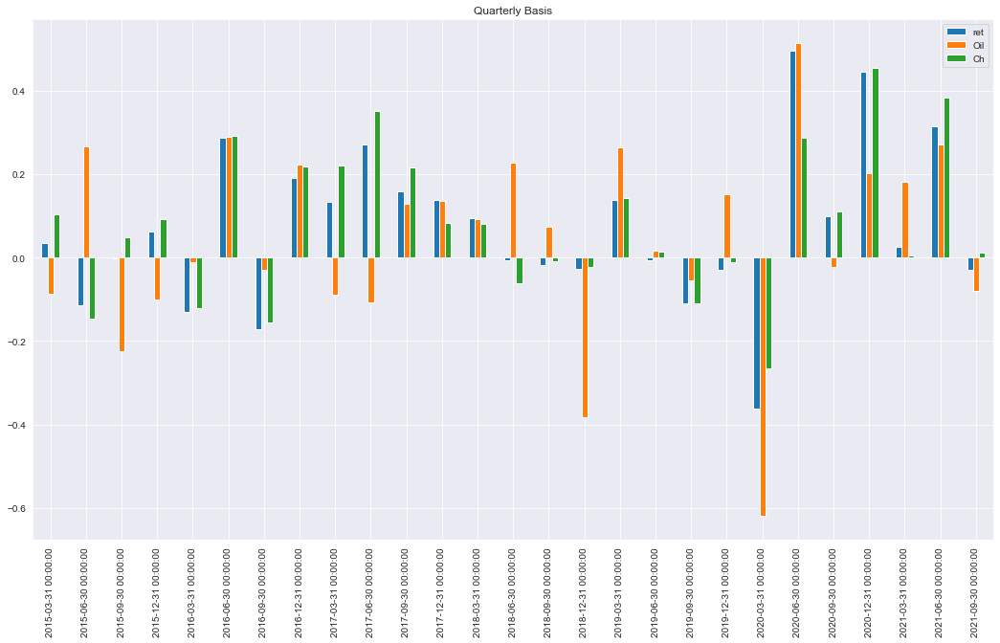

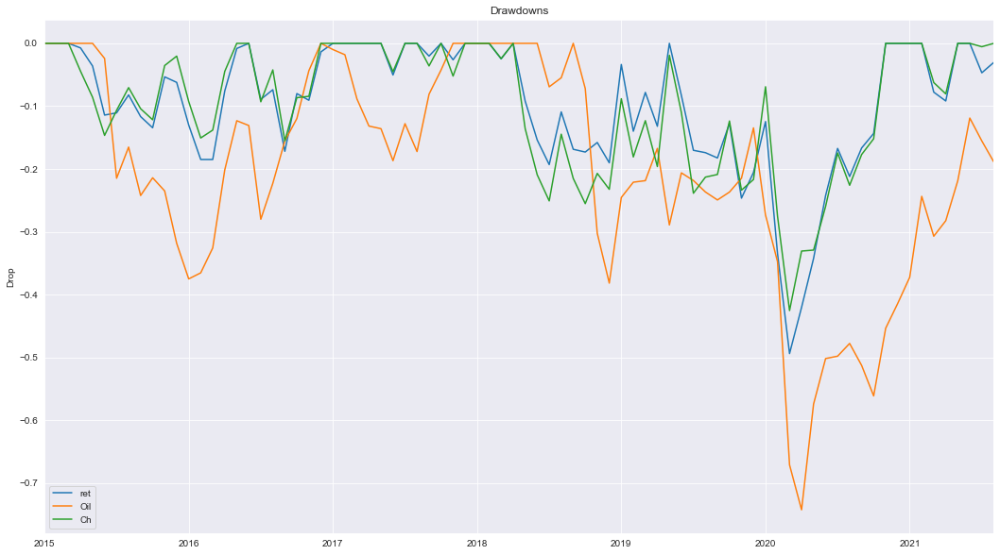

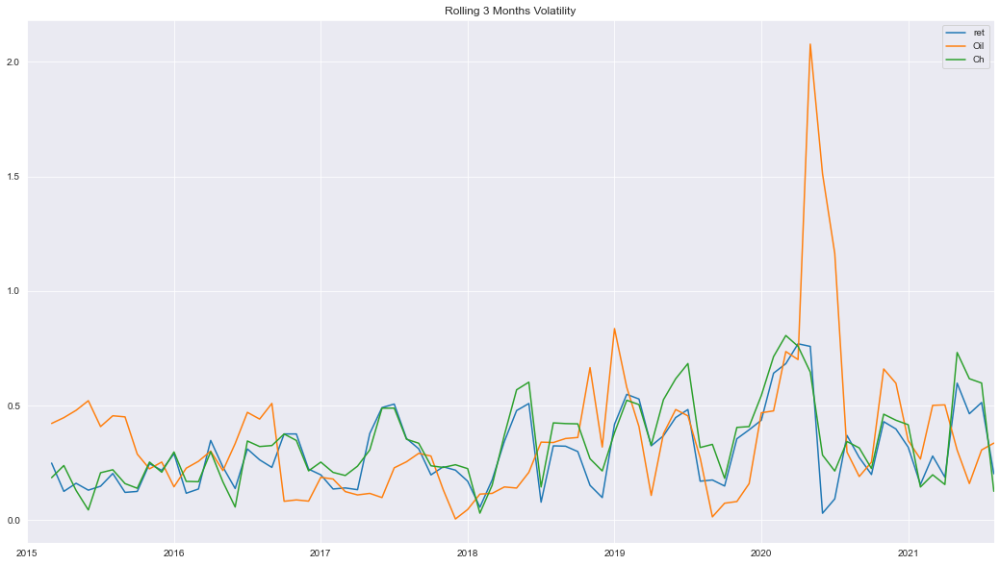

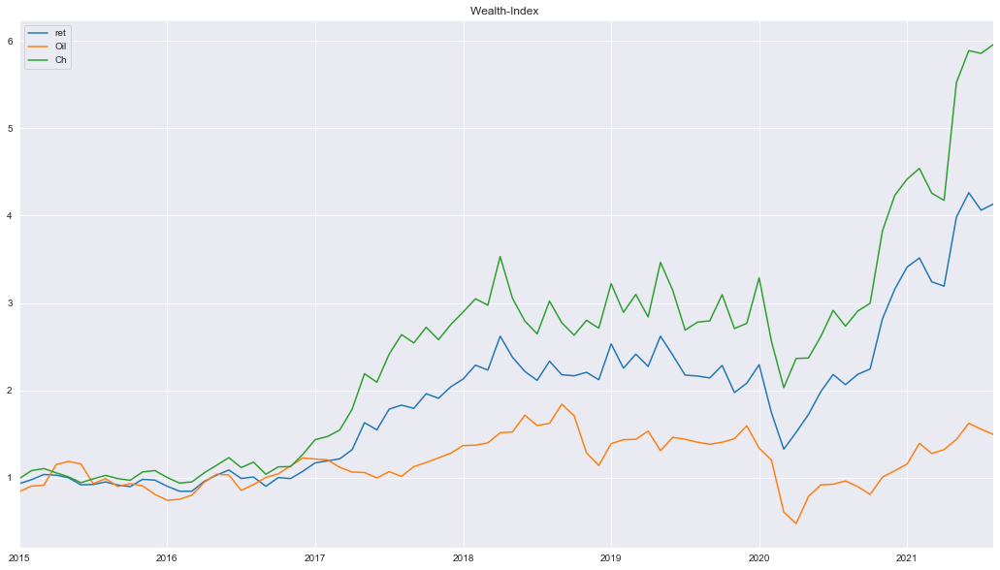

...

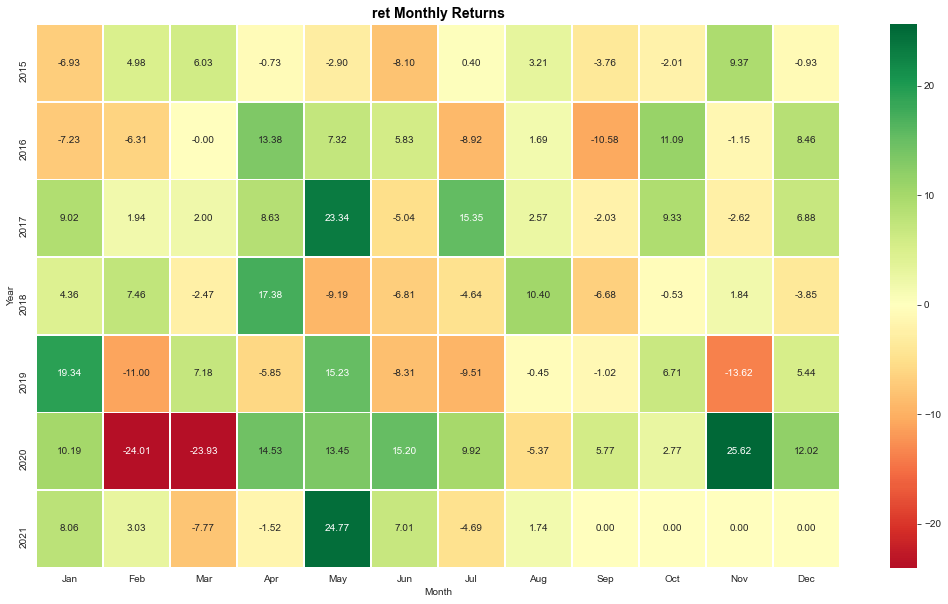

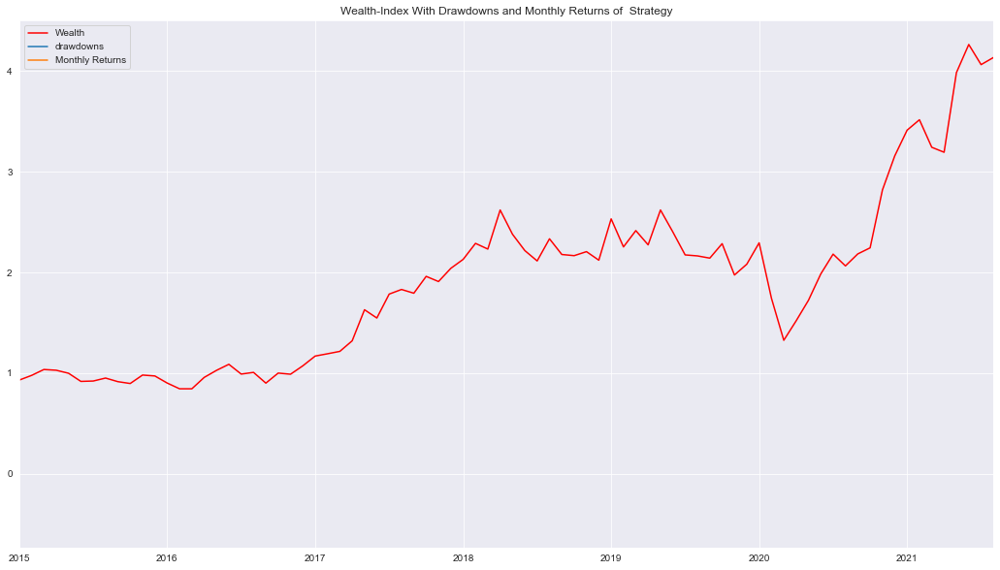

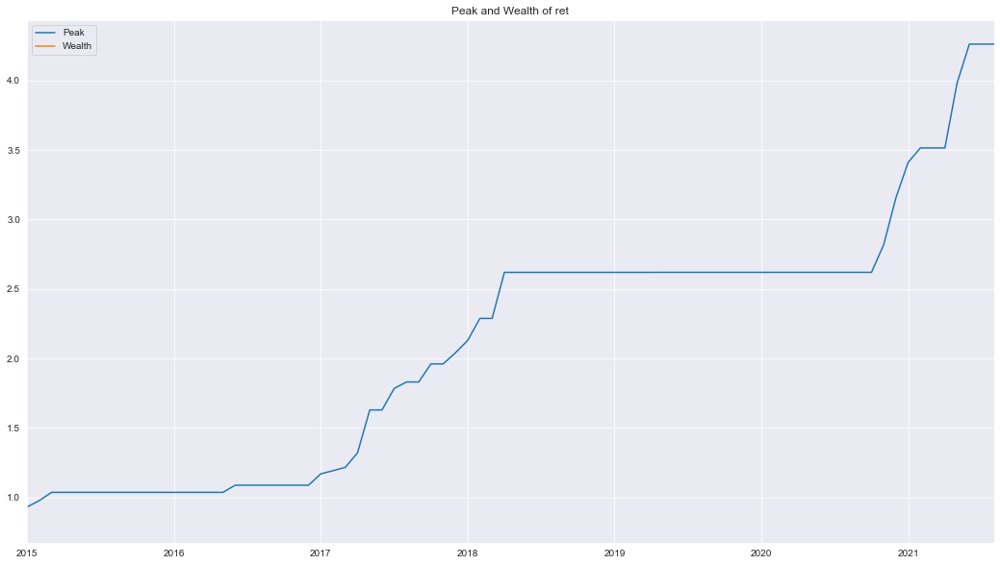

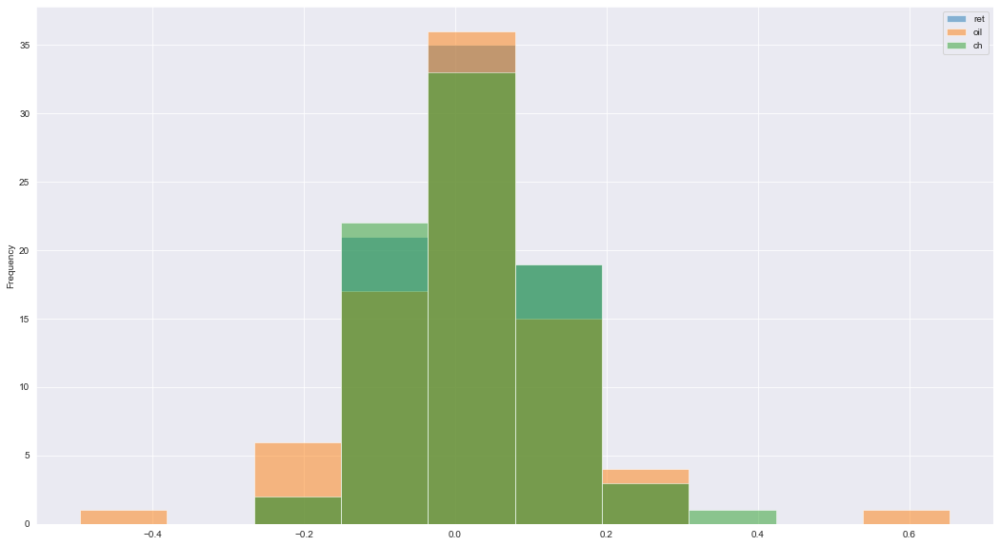

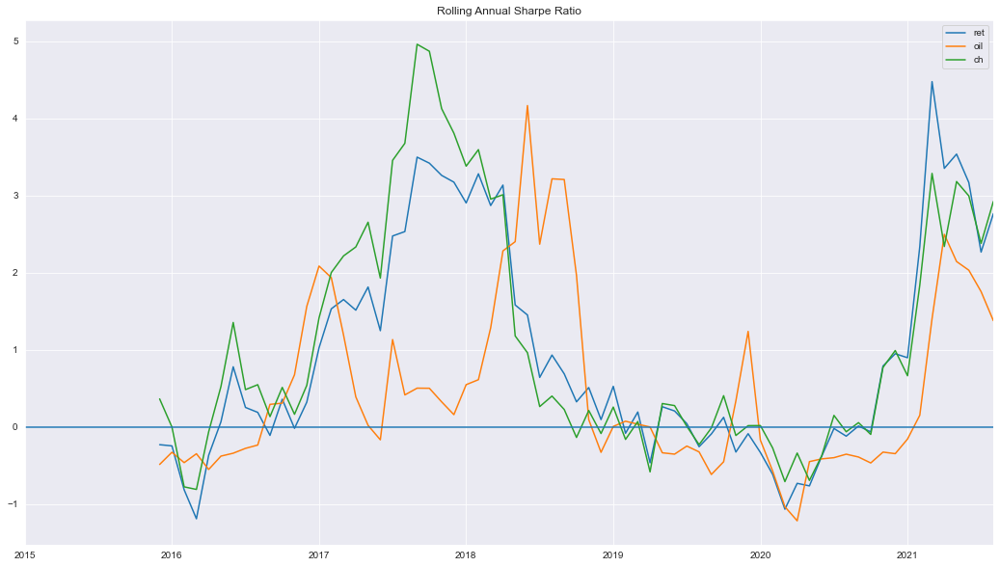

In [171]:
ts.tear_sheet(pd.concat([ff_monthly,future_concat_monthly],axis=1))